# Install lirary


In [1]:
!pip install -r requirements.txt

# Import Libary

In [2]:
import json
import pandas as pd
import matplotlib.pyplot as plt
from itables import show
import itertools

import nest_asyncio
import asyncio
import pandas as pd
import sys

nest_asyncio.apply()  # Patch Jupyter's asyncio loop

async def run_command(
    cmd,
    cwd=None,
    timeout=None,
    print_realtime=False
):
    """Run a shell command asynchronously with high performance.

    Args:
        cmd (str): The shell command to run.
        cwd (str): Optional working directory.
        timeout (float): Timeout in seconds.
        print_realtime (bool): If True, prints stdout/stderr line by line.

    Returns:
        dict: {
            "returncode": int,
            "stdout": str,
            "stderr": str,
            "command": str,
        }
    """
    proc = await asyncio.create_subprocess_shell(
        cmd,
        stdout=asyncio.subprocess.PIPE,
        stderr=asyncio.subprocess.PIPE,
        cwd=cwd
    )

    stdout, stderr = [], []

    try:
        async def read_stream(stream, buffer, stream_name):
            while True:
                line = await stream.readline()
                if line:
                    decoded = line.decode(errors="replace")
                    buffer.append(decoded)
                    if print_realtime:
                        print(f"[{stream_name}] {decoded}", end="")
                else:
                    break

        await asyncio.wait_for(
            asyncio.gather(
                read_stream(proc.stdout, stdout, "STDOUT"),
                read_stream(proc.stderr, stderr, "STDERR"),
                proc.wait()
            ),
            timeout=timeout
        )

    except asyncio.TimeoutError:
        proc.kill()
        return {
            "returncode": -1,
            "stdout": "".join(stdout),
            "stderr": "".join(stderr) + "\n[Timeout]",
            "command": cmd,
        }

    return {
        "returncode": proc.returncode,
        "stdout": "".join(stdout),
        "stderr": "".join(stderr),
        "command": cmd,
    }

def display_data(df):

    # --- Pivot to compare BRRT vs BRRT_Optimize ---
    pivot_time = df.pivot(index="run", columns="algorithm", values="search_time")
    pivot_length = df.pivot(index="run", columns="algorithm", values="path_length")
    pivot_nodes = df.pivot(index="run", columns="algorithm", values="node_count")
    pivot_success = df.pivot(index="run", columns="algorithm", values="success")
    pivot_idx = df.pivot(index="run", columns="algorithm", values="num_iterations")

    # --- Display deep-inspect comparison table ---


    # show(display_df, max_rows=20, max_columns=10, table_classes="table table-striped table-bordered")
    # --- Plot line charts for per-run comparison ---
    fig, axs = plt.subplots(4, 1, figsize=(10, 10), sharex=True)

    pivot_time.plot(ax=axs[0], marker='o', title="Search Time per Run")
    axs[0].set_ylabel("Time (s)")
    axs[0].grid(True)

    pivot_length.plot(ax=axs[1], marker='o', title="Path Length per Run")
    axs[1].set_ylabel("Length")
    axs[1].grid(True)

    pivot_nodes.plot(ax=axs[2], marker='o', title="Node Count per Run")
    axs[2].set_ylabel("Nodes")
    axs[2].set_xlabel("Run")
    axs[2].grid(True)


    pivot_idx.plot(ax=axs[3], marker='o', title="Iterations Count per Run")
    axs[3].set_ylabel("Interations")
    axs[3].set_xlabel("Run")
    axs[3].grid(True)

    plt.tight_layout()
    plt.show()
    return df


# Load all files into a list of dictionaries
def summary_statistics(raw_data):
    records = []
    for run_entry in raw_data["results"]:
        run = run_entry["run"]
        for algo_name, result in run_entry["algorithms"].items():
            records.append({
                "run": run,
                "algorithm": algo_name,
                "search_time": result["search_time"],
                "path_length": result["path_length"],
                "node_count": result["node_count"],
                "num_iterations": result.get("num_iterations", 0),
                "success": result["success"],
                "start": result["start"],
                "goal": result["goal"],
            })

    df = pd.DataFrame(records)
    # print(df)
    # --- Display deep-inspect comparison table ---


    agg = df.groupby("algorithm").agg(
        success_rate=("success", "mean"),
        avg_search_time=("search_time", "mean"),
        avg_path_length=("path_length", "mean"),
        avg_node_count=("node_count", "mean"),
        avg_iterations=("num_iterations", "mean")
    ).round(6)
    # show(agg)
    return df,agg

def summary_statistics_single(raw_data):
    records = []
    for run_entry in raw_data["results"]:
        run = run_entry["run"]
        for algo_name, result in run_entry["algorithms"].items():
            records.append({
                "run": run,
                "algorithm": algo_name,
                "search_time": result["search_time"],
                "path_length": result["path_length"],
                "node_count": result["node_count"],
                "num_iterations": result.get("num_iterations", 0),
                "success": result["success"],
                "start": result["start"],
                "goal": result["goal"],
            })

    df = pd.DataFrame(records)
    # print(df)
    # --- Display deep-inspect comparison table ---


    agg = df.groupby("algorithm").agg(
        success_rate=("success", "mean"),
        avg_search_time=("search_time", "mean"),
        avg_path_length=("path_length", "mean"),
        avg_node_count=("node_count", "mean"),
        avg_iterations=("num_iterations", "mean")
    ).round(6)

    sum = df.groupby("algorithm")[["search_time","path_length","node_count","num_iterations"]].sum().round(6)
    # show(agg)
    return df,agg,sum

def load_a_data(output_path):
    with open(output_path, 'r') as f:
        content = json.load(f)
        print("Parameters:", content["parameters"])
        sum_df, agg,sum = summary_statistics_single(content)
        show(sum, max_rows=20, max_columns=10, table_classes="table table-striped table-bordered")
        show(agg, max_rows=20, max_columns=10, table_classes="table table-striped table-bordered")
        show (sum_df, max_rows=20, max_columns=10, table_classes="table table-striped table-bordered")
        display_data(sum_df)
        

# AUTO TURNING

In [3]:
!bash ./build.sh
!source devel/setup.bash && roslaunch path_finder test_planners.launch

Base path: /home/x/Develop/brrt_optimize
Source space: /home/x/Develop/brrt_optimize/src
Build space: /home/x/Develop/brrt_optimize/build
Devel space: /home/x/Develop/brrt_optimize/devel
Install space: /home/x/Develop/brrt_optimize/install
####
#### Running command: "make cmake_check_build_system" in "/home/x/Develop/brrt_optimize/build"
####
####
#### Running command: "make -j12 -l12" in "/home/x/Develop/brrt_optimize/build"
####
[  0%] Built target geometry_msgs_generate_messages_eus
[  0%] Built target geometry_msgs_generate_messages_nodejs
[  0%] Built target geometry_msgs_generate_messages_lisp
[  0%] Built target std_msgs_generate_messages_lisp
[  0%] Built target geometry_msgs_generate_messages_py
[  0%] Built target std_msgs_generate_messages_nodejs
[  0%] Built target std_msgs_generate_messages_eus
[  0%] Built target std_msgs_generate_messages_py
[  0%] Built target geometry_msgs_generate_messages_cpp
[  0%] Built target std_msgs_generate_messages_cpp
[  0%] Built target rosg

# Generate test parameter

In [ ]:
import random
import time
# Define value sets
map_size = 50
espsilon_values = [map_size/100, map_size/50, map_size/25, map_size/10]
p1_values = [0.8,0.7, 0.5, 0.3]
u_p_values = [0,0.5,1,3,7,12]


configs = []
trial = 1

input_dir = "/home/x/Develop/evaluation/20250705/input/"
# Loop over p1 and u_p
for epsilon, p1, u_p in itertools.product(espsilon_values,p1_values, u_p_values):
    # Generate 10 random configurations for each combination
    for i in range(20):
        print(f"Running {i} trial {trial} with epsilon={epsilon}, p1={p1}, u_p={u_p}")
        numbers = random.choices(range(0, 10), k=3)
        environment = f"{epsilon:.2f}_{p1}_{u_p}_{round(numbers[0],2)}_{round(numbers[1],2)}_{round(numbers[2],2)}"
        config = {
            "trial": trial,
            "environment": environment,
            "p1": p1,
            "u_p": u_p,
            "alpha": round(numbers[0], 2),
            "beta": round(numbers[1], 2),
            "gamma": round(numbers[2], 2),
            "epsilon": epsilon,
        }
        input_path = input_dir + f"brrt_{environment}.json"
        with open(input_path, "w") as f:
            json.dump(config, f, indent=4)

        # cmd = f"bash -c 'source /home/x/Develop/brrt_optimize/devel/setup.bash && roslaunch path_finder test_planners.launch input_param:={input_path} output_result:={output_dir}'"    
        # cmd = f"source /home/x/Develop/brrt_optimize/devel/setup.bash && roslaunch path_finder test_planners.launch input_param:={input_path} output_result:={output_dir}"
        # print(f"Running command: {cmd}")
        trial += 1
        # time.sleep(2)
        # ! {cmd}

        

    
    # results = await asyncio.gather(*tasks)
    # for idx, (code, out, err) in enumerate(results):
    #     print(f"\nRow {idx}: Exit Code {code}")
    #     if out.strip():
    #         print("STDOUT:", out.strip())
    #     if err.strip():
    #         print("STDERR:", err.strip())
    # break 
    # # Run all tasks concurrently
    #     # print(config)
    #     # # configs.append(config)
    #     # with open("brrt_input.json", "w") as f:
    #     #     json.dump(config, f, indent=4)
    #     # ! source devel/setup.bash && roslaunch path_finder test_planners.launch
      

# Save to file



In [ ]:
import os
import time
output_dir = "/home/x/Develop/evaluation/20250705/output-10/"
input_dir = "/home/x/Develop/evaluation/20250705/input/"

files_input = set(os.listdir(input_dir))
files_output = set(os.listdir(output_dir))

only_in_input = files_input - files_output
print("Files in A not in B:")
for f in sorted(only_in_input):
    print(f)
    cmd = f"source /home/x/Develop/brrt_optimize/devel/setup.bash && roslaunch path_finder test_planners.launch input_param:={input_dir + f} output_result:={output_dir+f}"
    print(f"Running command: {cmd}")
    ! {cmd}
    time.sleep(1)

Files in A not in B:
brrt_0.50_0.3_0.5_0_2_8.json
brrt_0.50_0.3_0.5_0_3_2.json
brrt_0.50_0.3_0.5_0_4_9.json
brrt_0.50_0.3_0.5_0_6_7.json
brrt_0.50_0.3_0.5_0_7_0.json
brrt_0.50_0.3_0.5_0_8_1.json
brrt_0.50_0.3_0.5_1_5_6.json
brrt_0.50_0.3_0.5_1_7_8.json
brrt_0.50_0.3_0.5_1_8_6.json
brrt_0.50_0.3_0.5_1_9_3.json
brrt_0.50_0.3_0.5_1_9_6.json
brrt_0.50_0.3_0.5_2_5_7.json
brrt_0.50_0.3_0.5_3_3_1.json
brrt_0.50_0.3_0.5_4_2_6.json
brrt_0.50_0.3_0.5_4_6_3.json
brrt_0.50_0.3_0.5_4_9_3.json
brrt_0.50_0.3_0.5_7_5_7.json
brrt_0.50_0.3_0.5_8_2_3.json
brrt_0.50_0.3_0.5_8_2_6.json
brrt_0.50_0.3_0.5_9_1_5.json
brrt_0.50_0.3_0_0_4_4.json
brrt_0.50_0.3_0_0_9_6.json
brrt_0.50_0.3_0_1_6_7.json
brrt_0.50_0.3_0_2_1_2.json
brrt_0.50_0.3_0_2_3_2.json
brrt_0.50_0.3_0_3_1_5.json
brrt_0.50_0.3_0_3_1_6.json
brrt_0.50_0.3_0_3_3_2.json
brrt_0.50_0.3_0_3_8_1.json
brrt_0.50_0.3_0_3_8_9.json
brrt_0.50_0.3_0_4_4_1.json
brrt_0.50_0.3_0_4_8_3.json
brrt_0.50_0.3_0_5_9_4.json
brrt_0.50_0.3_0_5_9_7.json
brrt_0.50_0.3_0_6_9_3

# Read all files in the directory

In [4]:
import glob
file_paths = glob.glob("/home/x/Develop/evaluation/20250705-20/output/*")
data_agg = {}
data_summary_df = {}
for path in file_paths:
    with open(path, 'r') as f:
        content = json.load(f)
        sum_df, agg = summary_statistics(content)
        data_agg[path] = agg
        data_summary_df[path] = sum_df

In [5]:
print(len(file_paths))

804


# Select the best

best_all_file File: /home/x/Develop/evaluation/20250705-20/output/brrt_2.50_0.3_0.5_2_0_0.json, Score: 3.461264819869486
Parameters: {'alpha': 2.0, 'beta': 0.0, 'epsilon': 2.5, 'gamma': 0.0, 'p1': 0.3, 'u_p': 0.5}


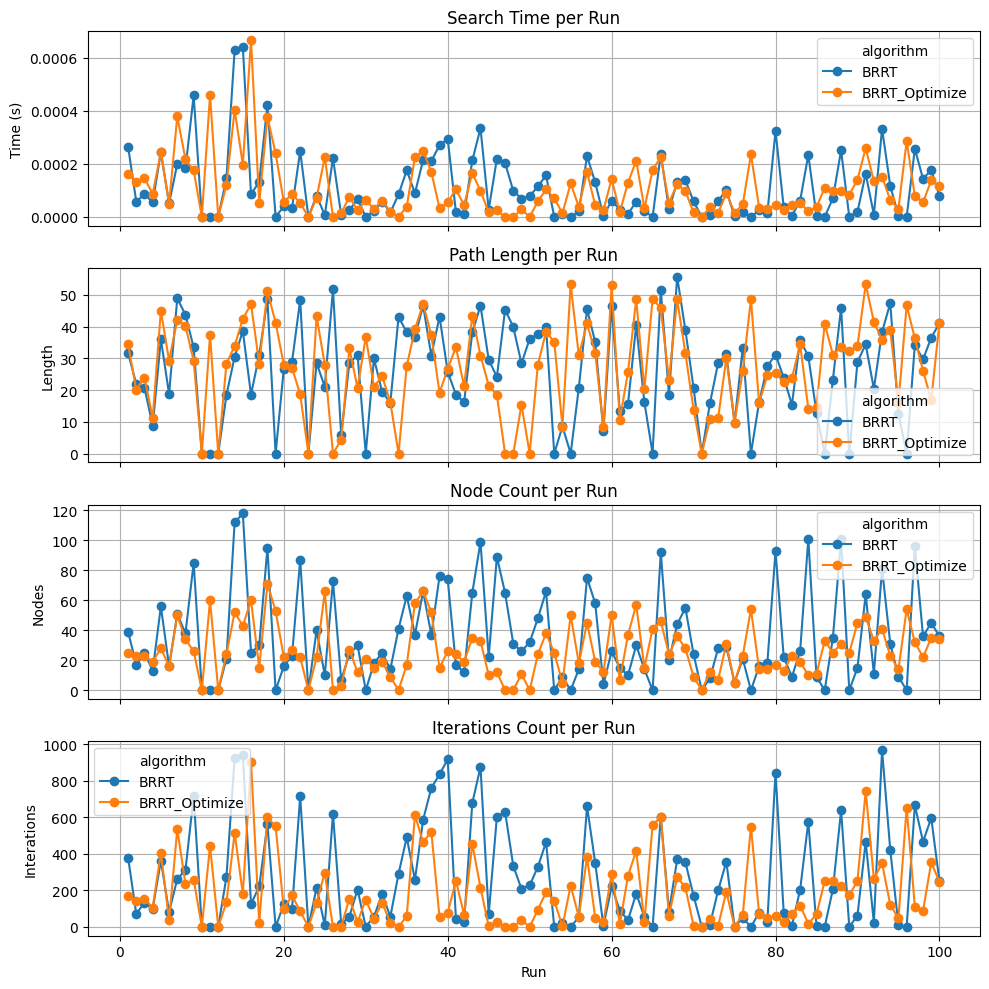

best_time_file File: /home/x/Develop/evaluation/20250705-20/output/brrt_2.50_0.3_0.5_2_0_0.json, Score: 0.954954954954955
Parameters: {'alpha': 2.0, 'beta': 0.0, 'epsilon': 2.5, 'gamma': 0.0, 'p1': 0.3, 'u_p': 0.5}


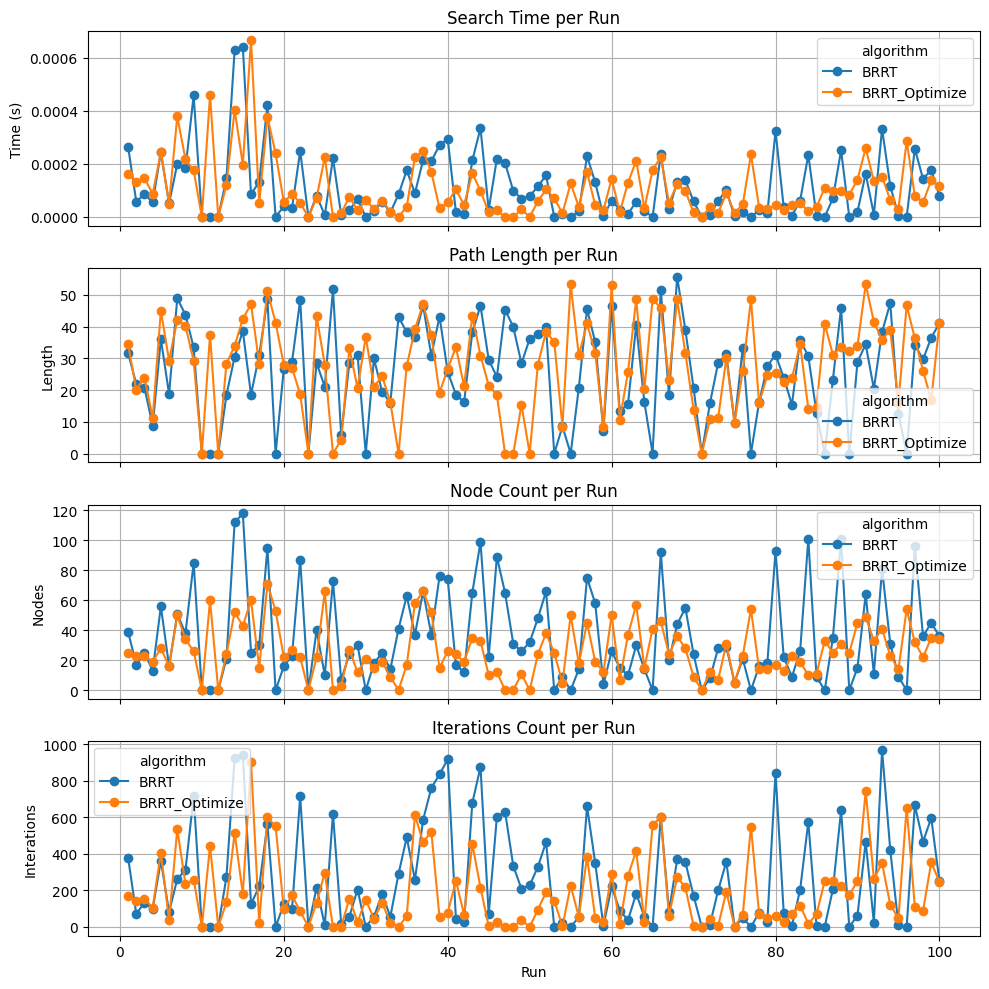

best_path_length_file File: /home/x/Develop/evaluation/20250705-20/output/brrt_2.50_0.5_3_2_4_3.json, Score: 0.8941935342994116
Parameters: {'alpha': 2.0, 'beta': 4.0, 'epsilon': 2.5, 'gamma': 3.0, 'p1': 0.5, 'u_p': 3.0}


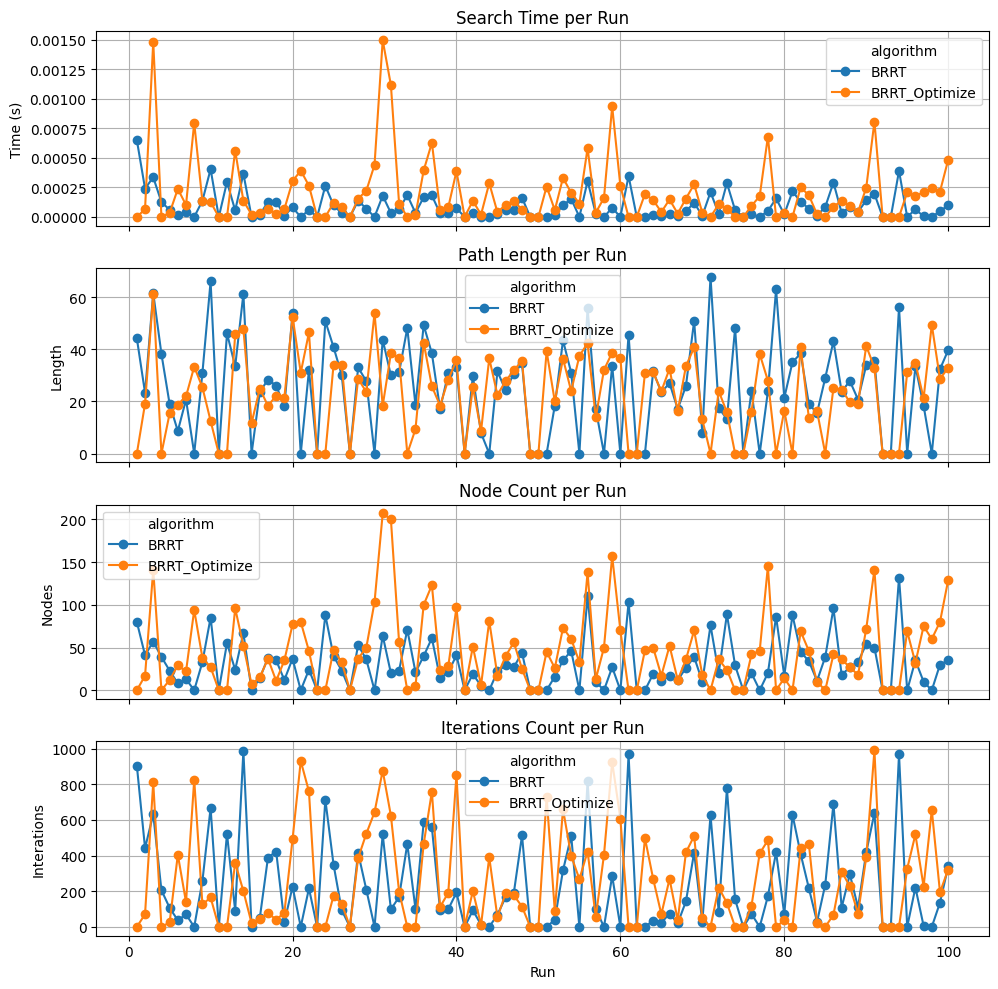

best_node_count_file File: /home/x/Develop/evaluation/20250705-20/output/brrt_2.50_0.3_0.5_2_0_0.json, Score: 0.7409518381305215
Parameters: {'alpha': 2.0, 'beta': 0.0, 'epsilon': 2.5, 'gamma': 0.0, 'p1': 0.3, 'u_p': 0.5}


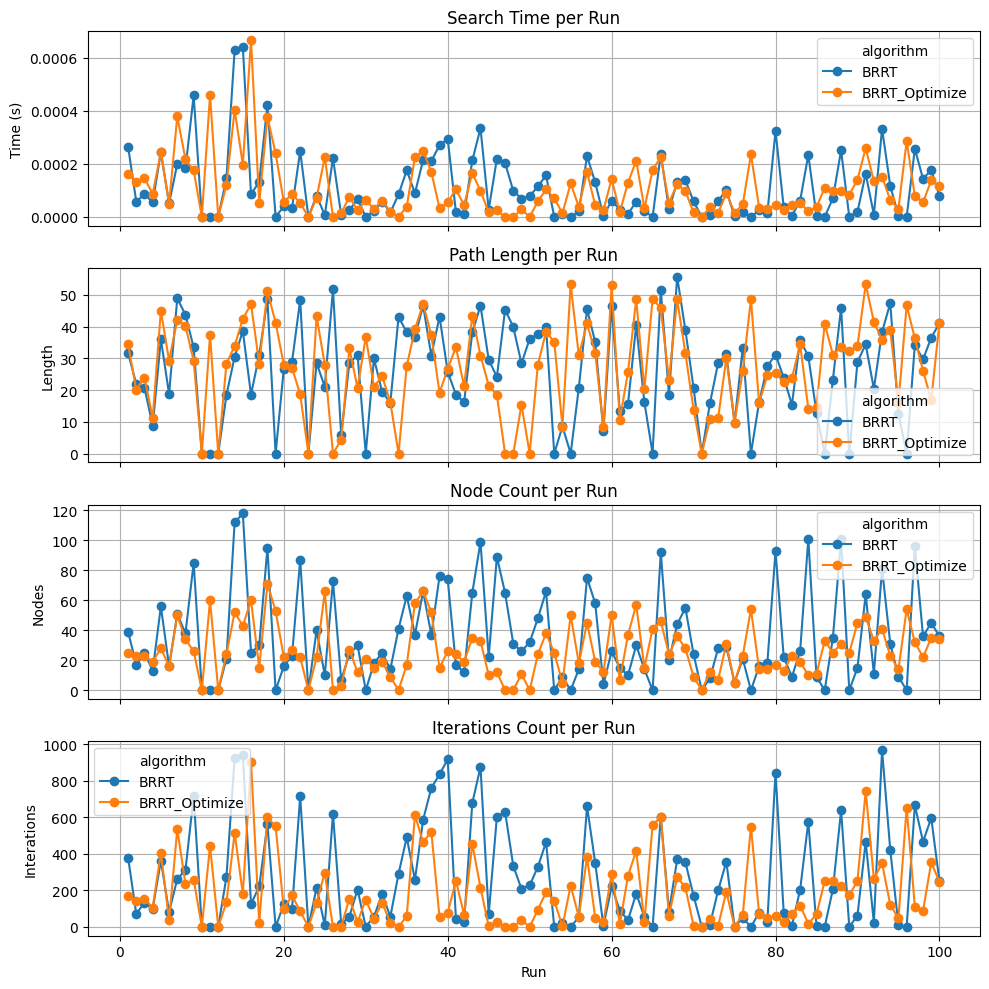

best_iterations_file File: /home/x/Develop/evaluation/20250705-20/output/brrt_2.50_0.3_0.5_2_0_0.json, Score: 0.7035273106116983
Parameters: {'alpha': 2.0, 'beta': 0.0, 'epsilon': 2.5, 'gamma': 0.0, 'p1': 0.3, 'u_p': 0.5}


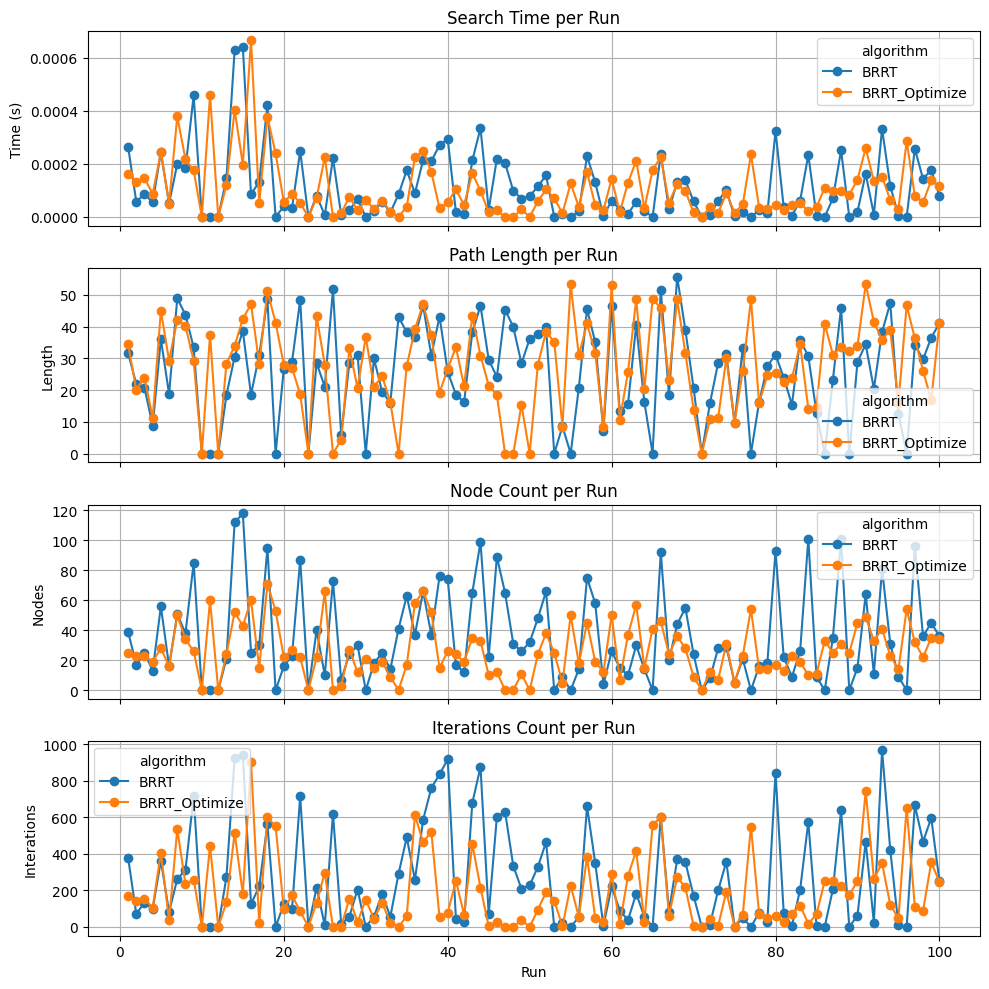

In [7]:



def select_the_better_han(all_data:dict):
    best_all = 1000000
    best_all_file = None

    best_time = 1000000
    best_time_file = None

    best_path_length = 1000000
    best_path_length_file = None    

    best_node_count = 1000000
    best_node_count_file = None

    best_iterations = 1000000
    best_iterations_file = None
    for filepath, df in all_data.items():
        if (df.loc['BRRT_Optimize']["success_rate"] < df.loc['BRRT']["success_rate"]):
            continue
        mul = df.loc['BRRT_Optimize']/ df.loc['BRRT']
        percent = mul [['avg_search_time', 'avg_path_length','avg_node_count', 'avg_iterations']]
        # print(f"File: {filepath}",percent)
        sum_percent = percent.sum().sum()
        if (sum_percent < best_all):
            best_all_file = filepath
            best_all = sum_percent
        if (percent['avg_search_time'] < best_time):
            best_time_file = filepath
            best_time = percent['avg_search_time']
     
        if (percent['avg_path_length'] < best_path_length):
            best_path_length_file = filepath
            best_path_length = percent['avg_path_length']
        if (percent['avg_node_count'] < best_node_count):
            best_node_count_file = filepath
            best_node_count = percent['avg_node_count']
        if (percent['avg_iterations'] < best_iterations):
            best_iterations_file = filepath
            best_iterations = percent['avg_iterations']
    return {
        "best_all_file": best_all_file,
        "best_all": best_all,
        "best_time_file": best_time_file,
        "best_time": best_time,
        "best_path_length_file": best_path_length_file,
        "best_path_length": best_path_length,
        "best_node_count_file": best_node_count_file,
        "best_node_count": best_node_count,
        "best_iterations_file": best_iterations_file,
        "best_iterations": best_iterations
    }
summary = select_the_better_han(data_agg)
 
print(f"best_all_file File: {summary['best_all_file']}, Score: {summary['best_all']}")

load_a_data(summary["best_all_file"])

print(f"best_time_file File: {summary['best_time_file']}, Score: {summary['best_time']}")
load_a_data(summary["best_time_file"])
print(f"best_path_length_file File: {summary['best_path_length_file']}, Score: {summary['best_path_length']}")
load_a_data(summary["best_path_length_file"])
print(f"best_node_count_file File: {summary['best_node_count_file']}, Score: {summary['best_node_count']}")
load_a_data(summary["best_node_count_file"])
print(f"best_iterations_file File: {summary['best_iterations_file']}, Score: {summary['best_iterations']}")
load_a_data(summary["best_iterations_file"])    


File: ./data/brrt_output0.5-2.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 3.997997997997998, Diff: 0.3016475124009319


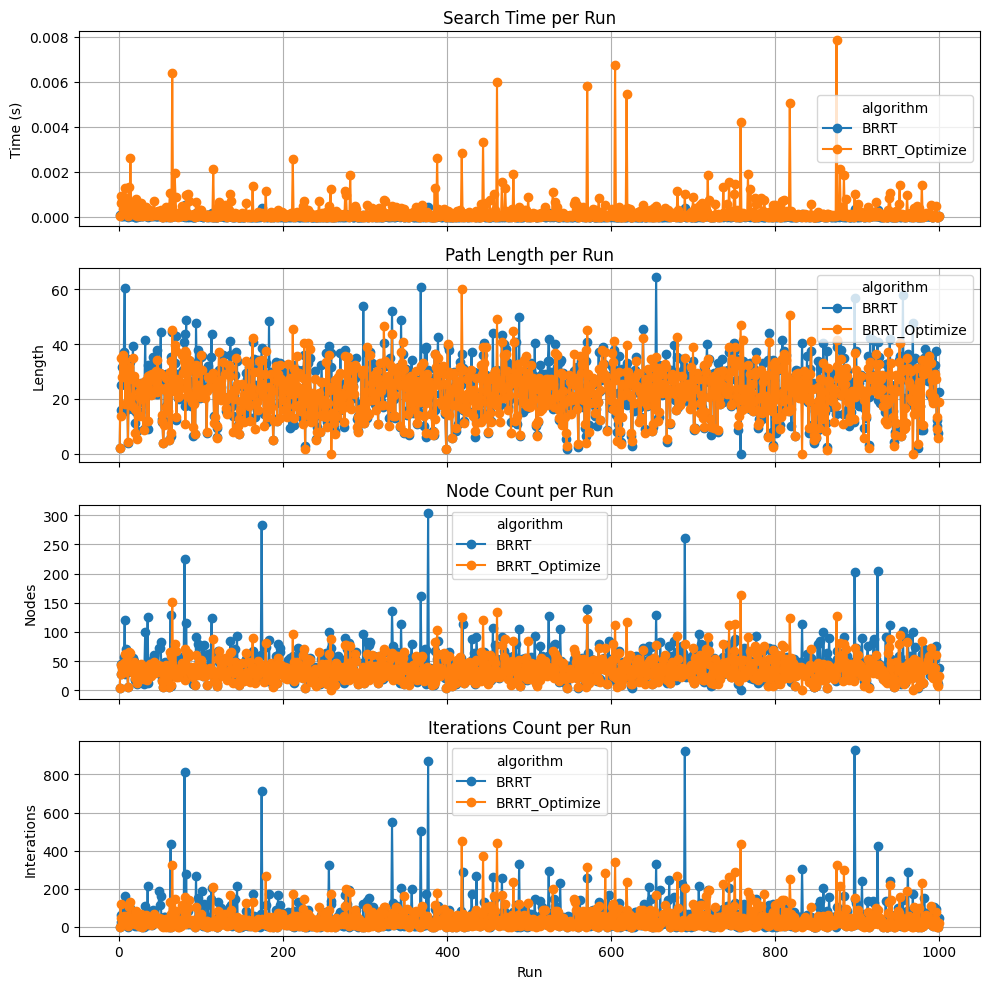

File: ./data/brrt_output0.3-6.0|0.6-0.2-0.2.json, BRRT_Optimize_score: 3.998996990972919, Diff: 0.21451659984875882


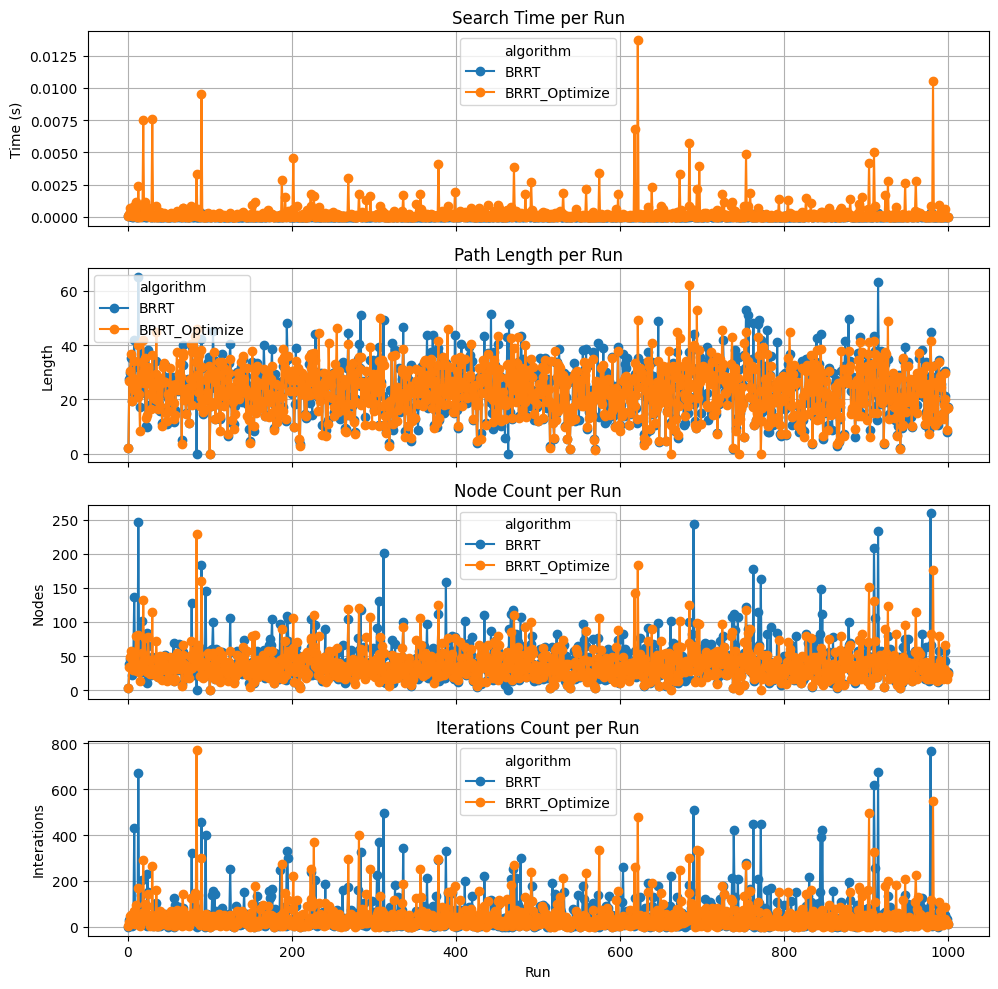

File: ./data/brrt_output0.3-6.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.1706211100076236


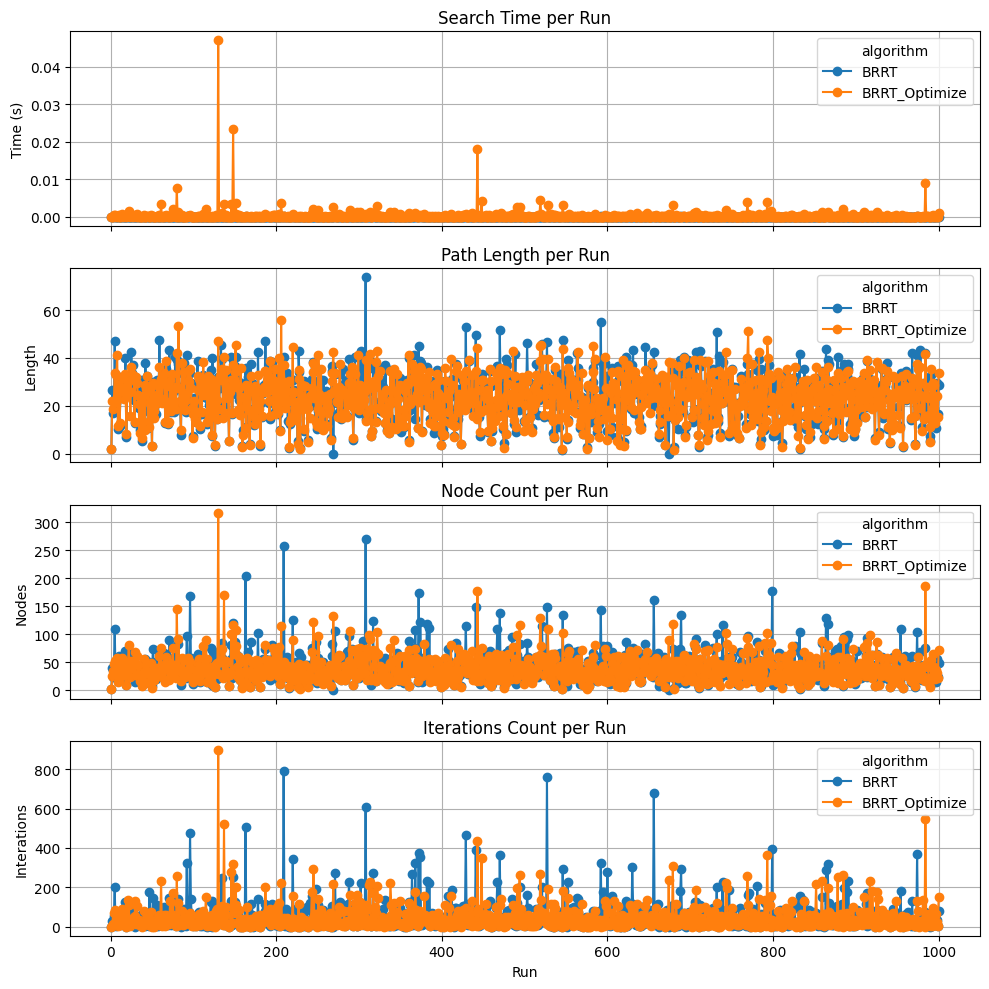

File: ./data/brrt_output0.3-2.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 3.998998998998999, Diff: 0.1696726524273786


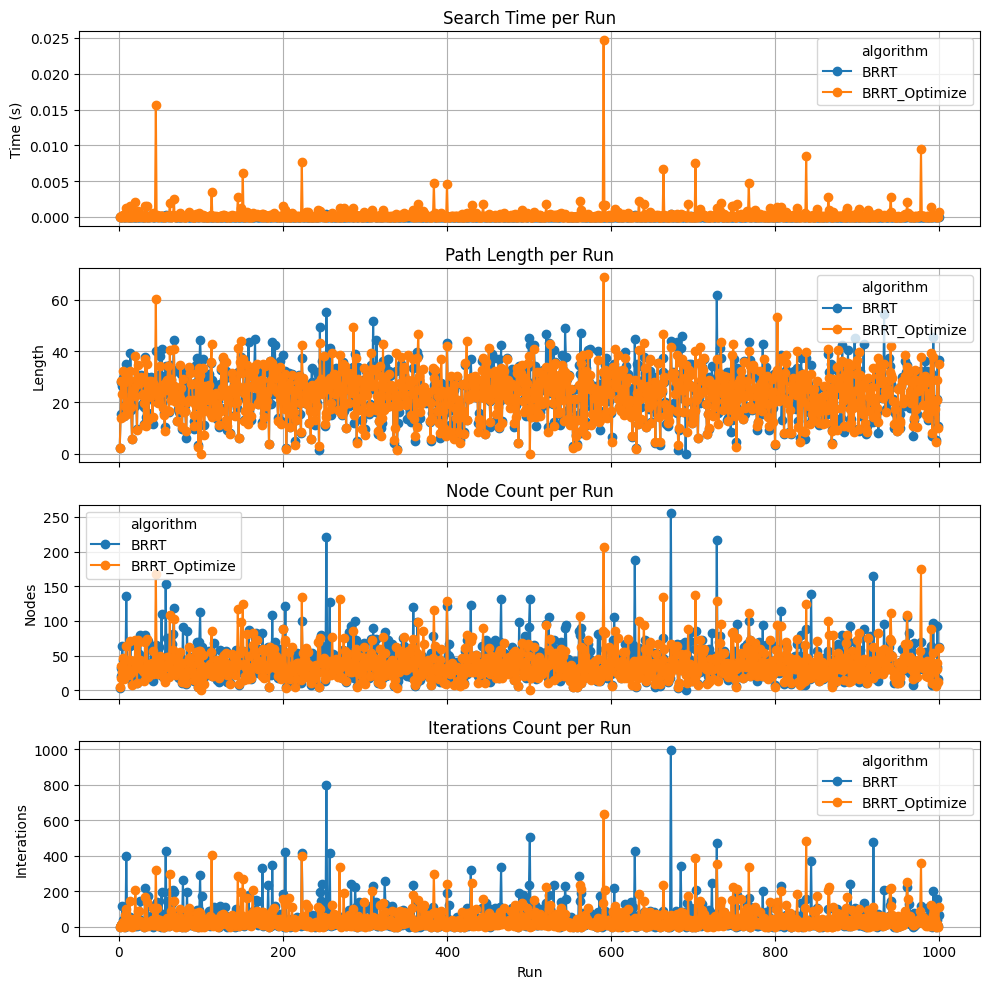

File: ./data/brrt_output0.5-1.5|0.8-0.2--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.16520568751147557


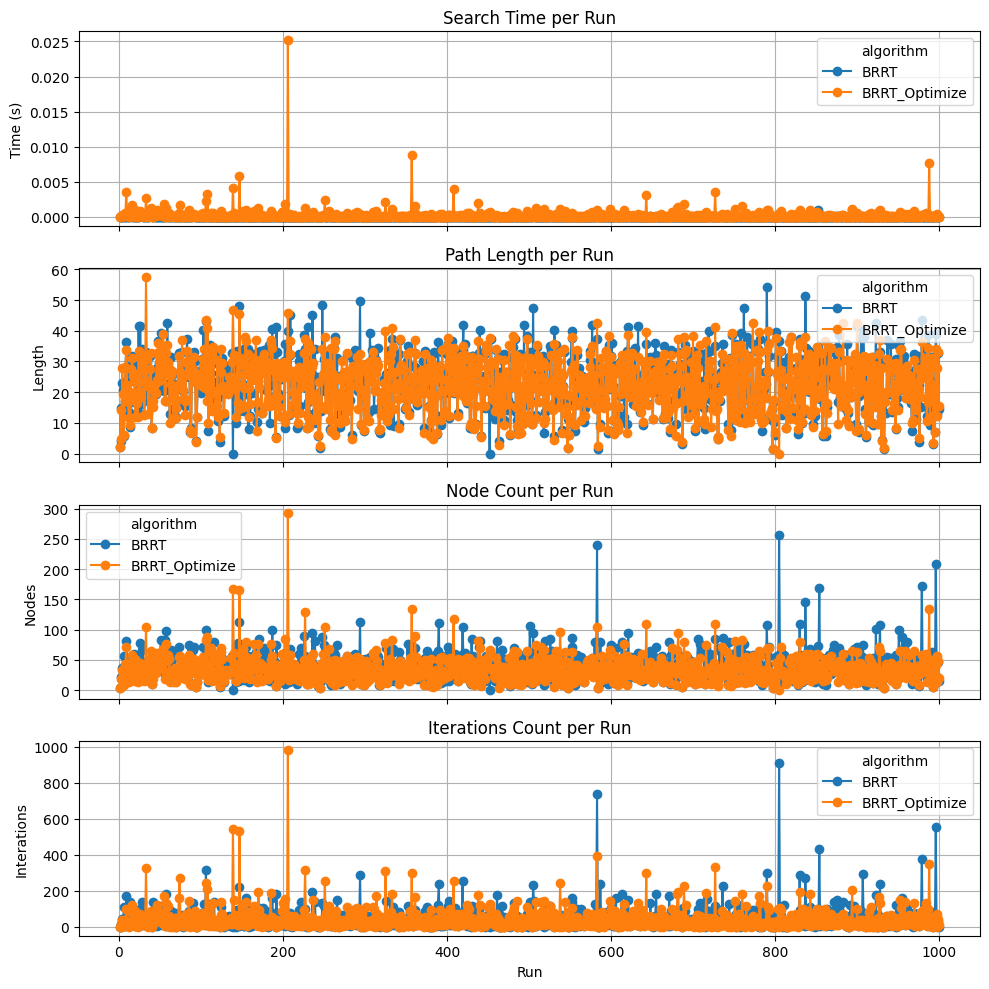

File: ./data/brrt_output0.5-4.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.15945595313846095


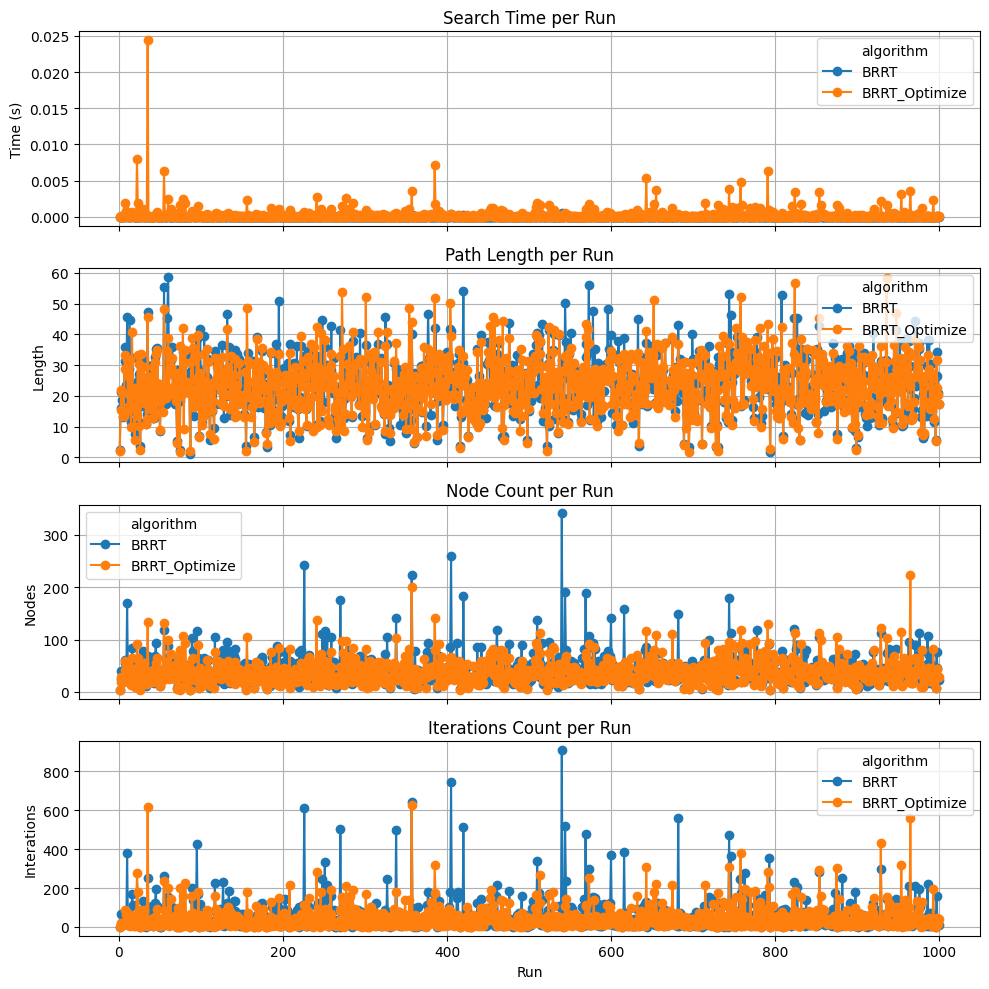

File: ./data/brrt_output0.3-4.0|0.2-0.8-0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.14956898415333253


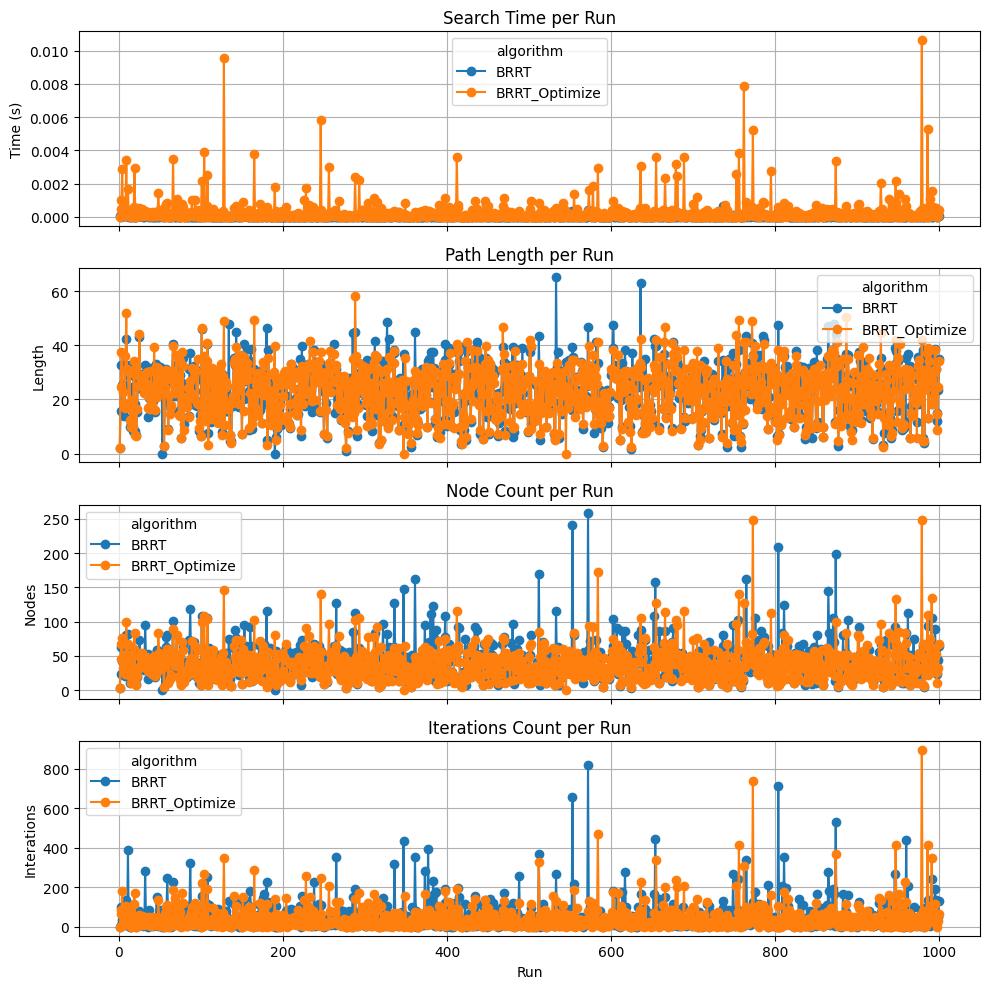

File: ./data/brrt_output0.5-4.0|0.2-0.6-0.2.json, BRRT_Optimize_score: 3.998997995991984, Diff: 0.14683213198101175


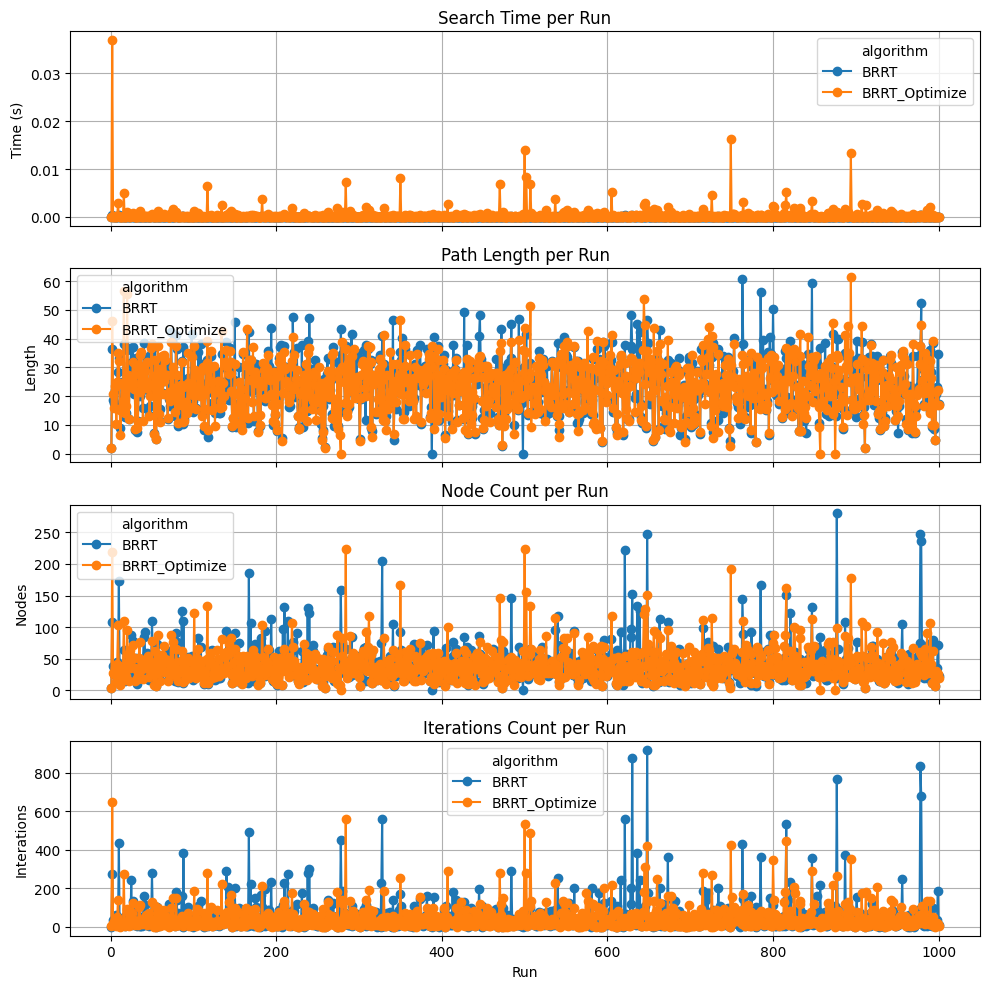

File: ./data/brrt_output0.5-1.5|0.6-0.2-0.2.json, BRRT_Optimize_score: 3.999, Diff: 0.14501196067082


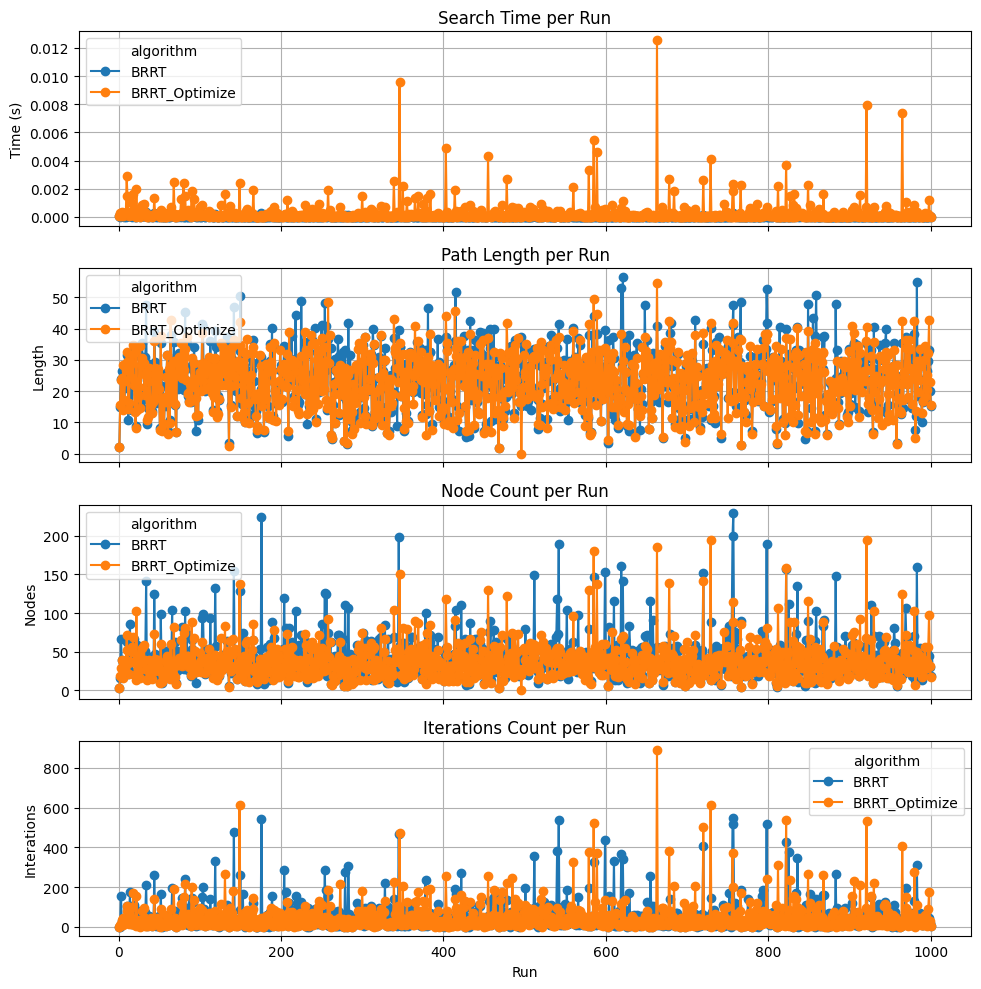

File: ./data/brrt_output0.5-4.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.13980913079055934


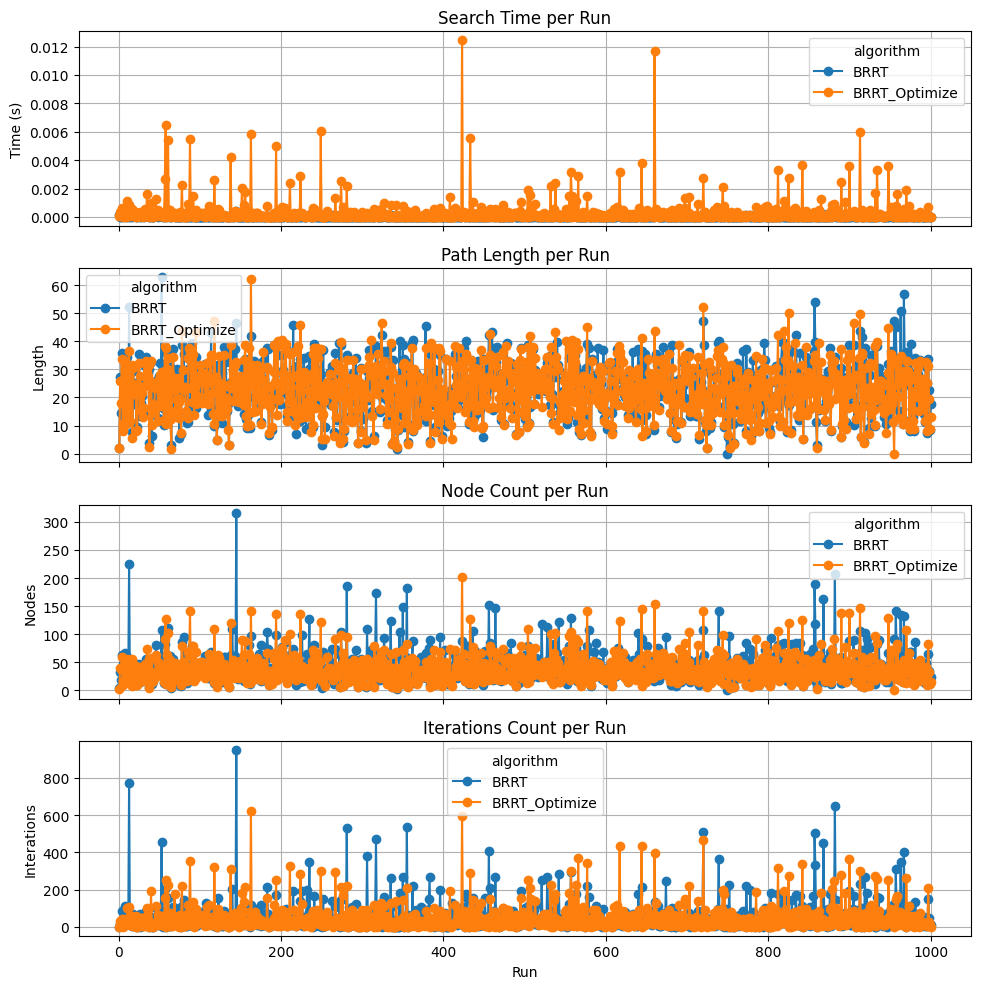

File: ./data/brrt_output0.5-1.5|0.4-0.2-0.4.json, BRRT_Optimize_score: 4.0, Diff: 0.13392840600824973


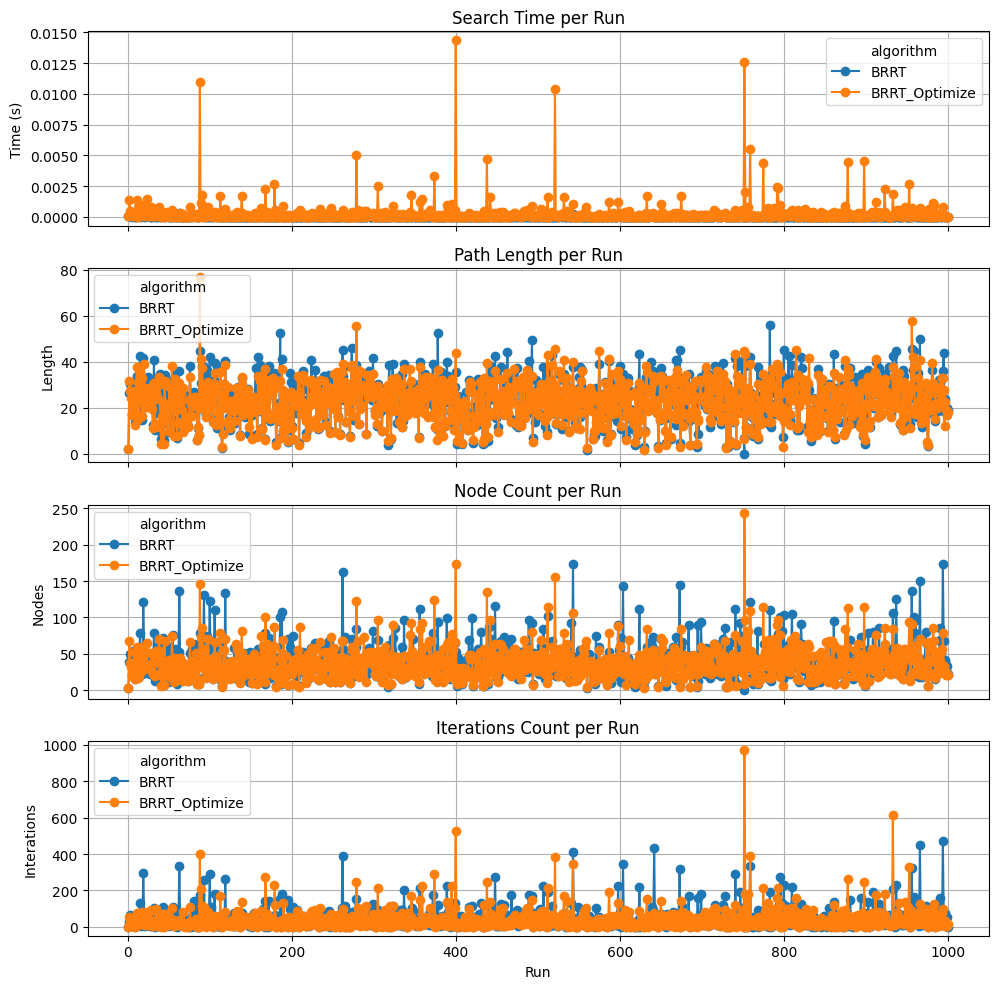

File: ./data/brrt_output0.5-1.5|0.6-0.4--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.1306236855115399


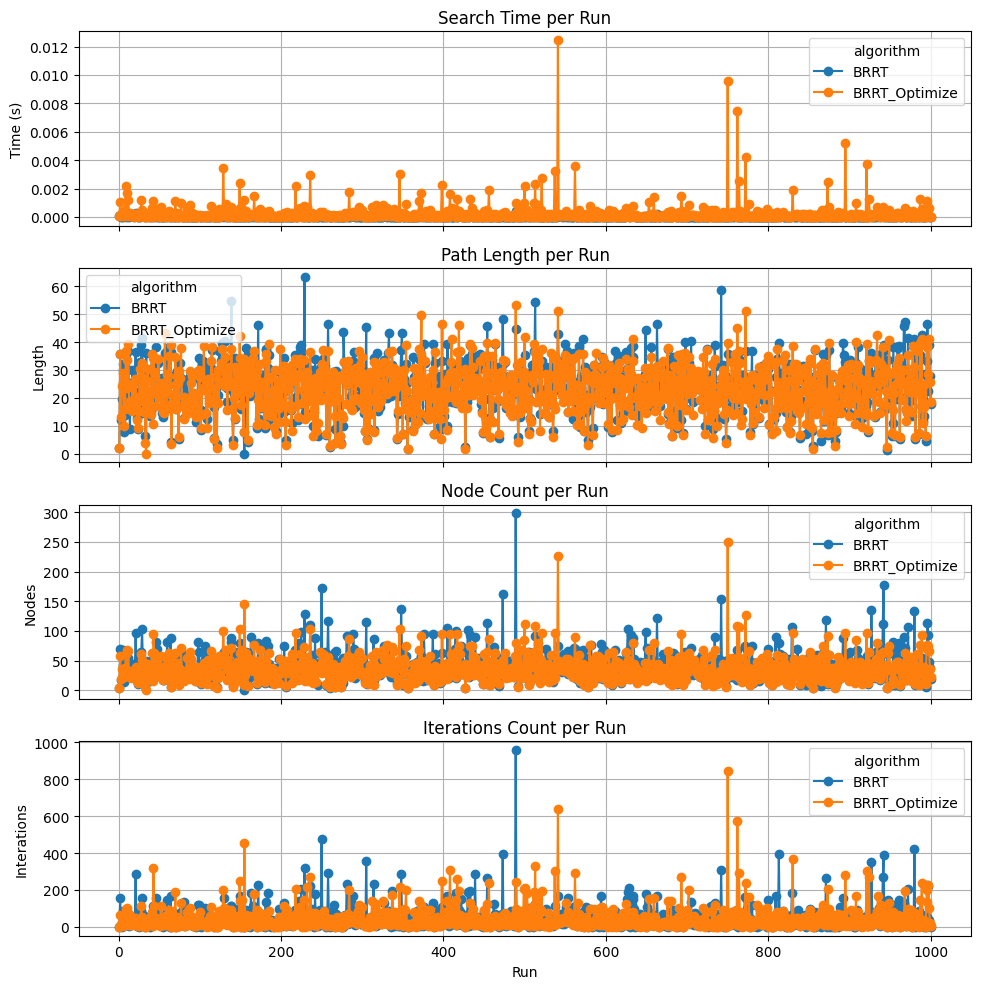

File: ./data/brrt_output0.3-1.5|0.6-0.2-0.2.json, BRRT_Optimize_score: 4.0, Diff: 0.1286110888231864


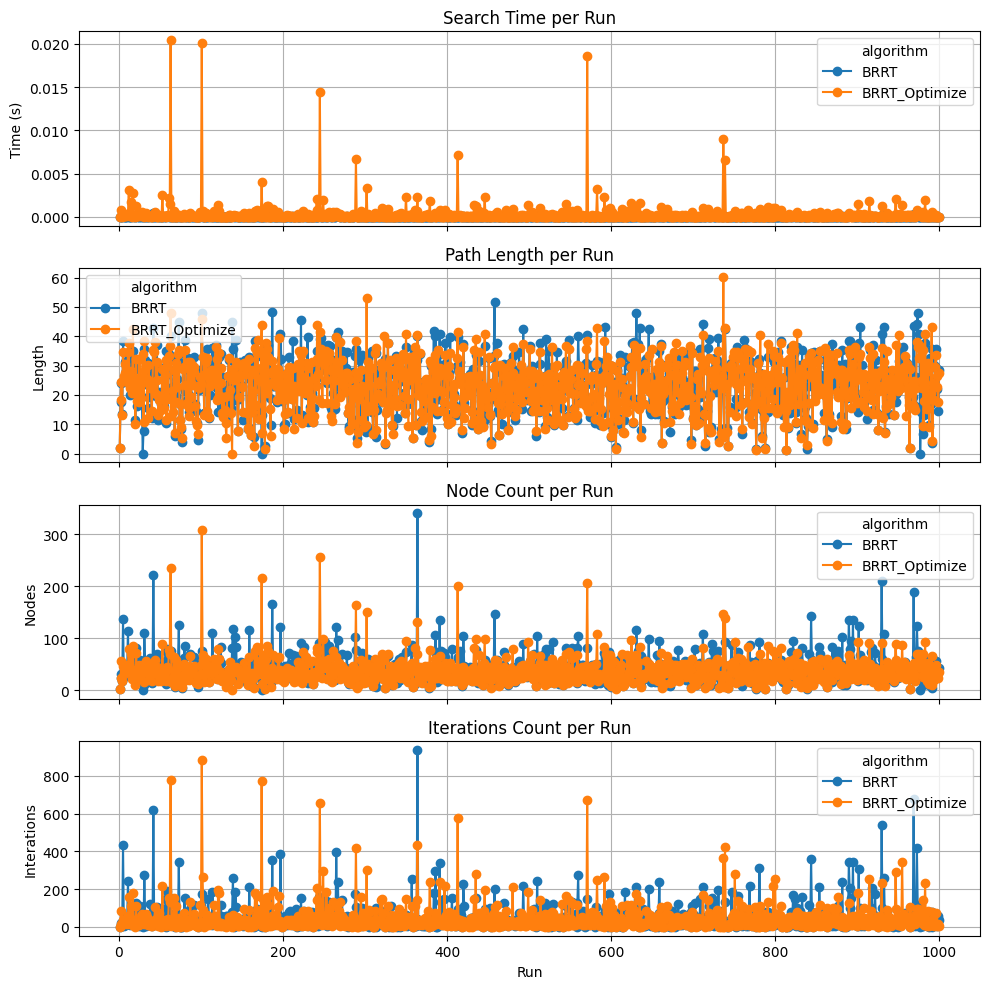

File: ./data/brrt_output0.3-8.0|0.2-0.2-0.6.json, BRRT_Optimize_score: 4.0, Diff: 0.12838050247199995


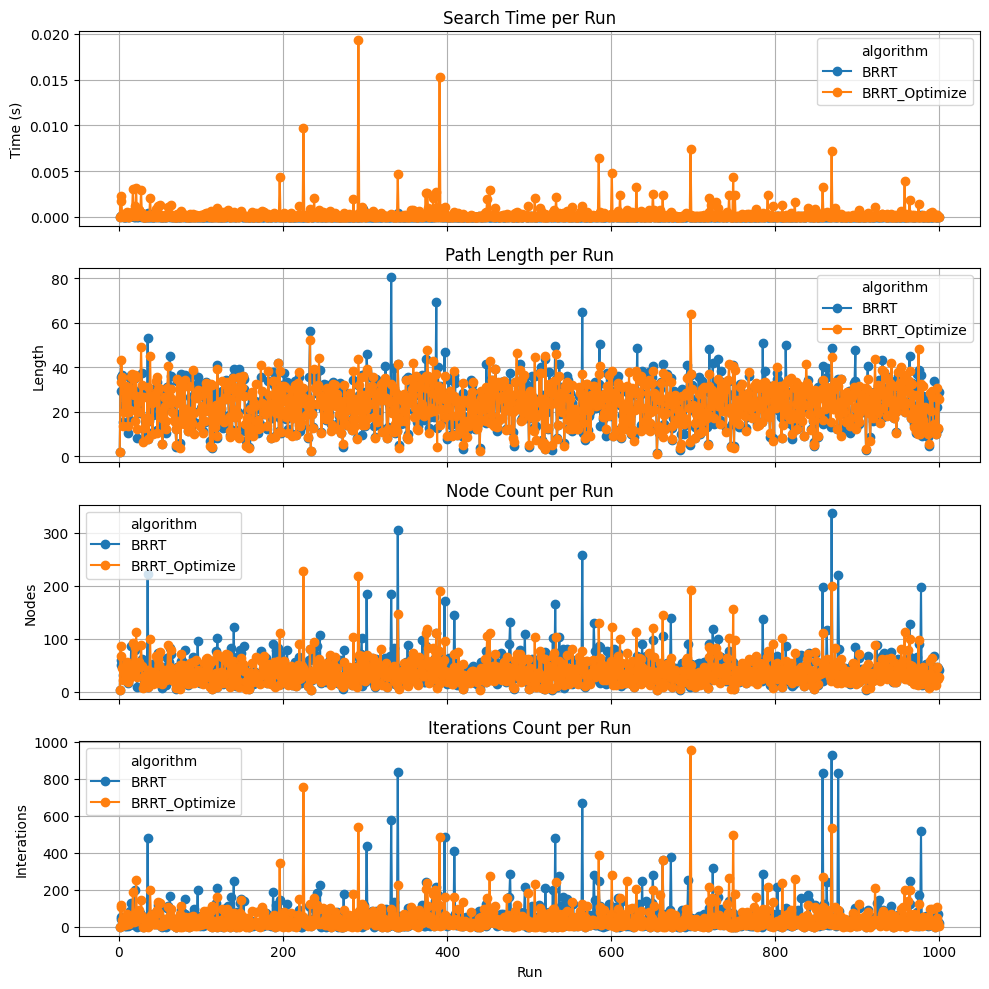

File: ./data/brrt_output0.5-6.0|0.2-0.2-0.6.json, BRRT_Optimize_score: 4.0, Diff: 0.1275138681750736


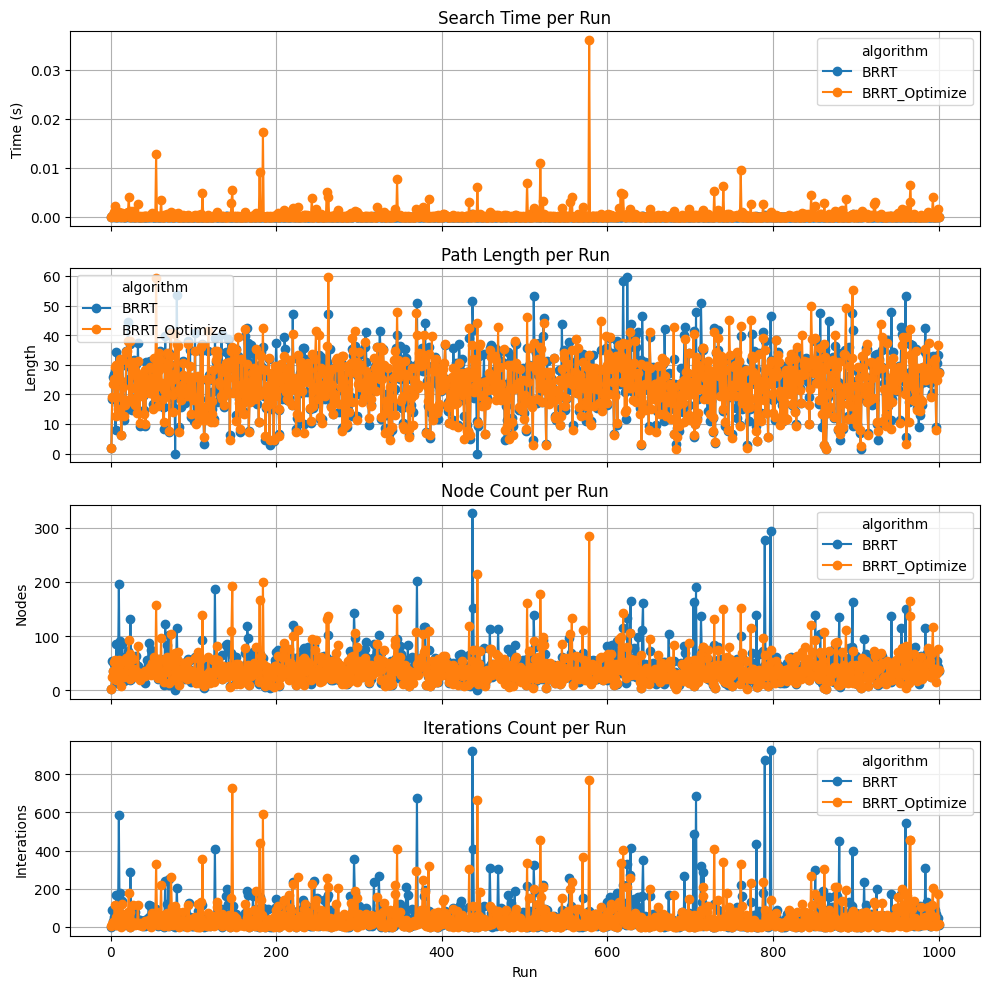

File: ./data/brrt_output0.5-2.0|0.6-0.2-0.2.json, BRRT_Optimize_score: 3.998998998998999, Diff: 0.12437955996538408


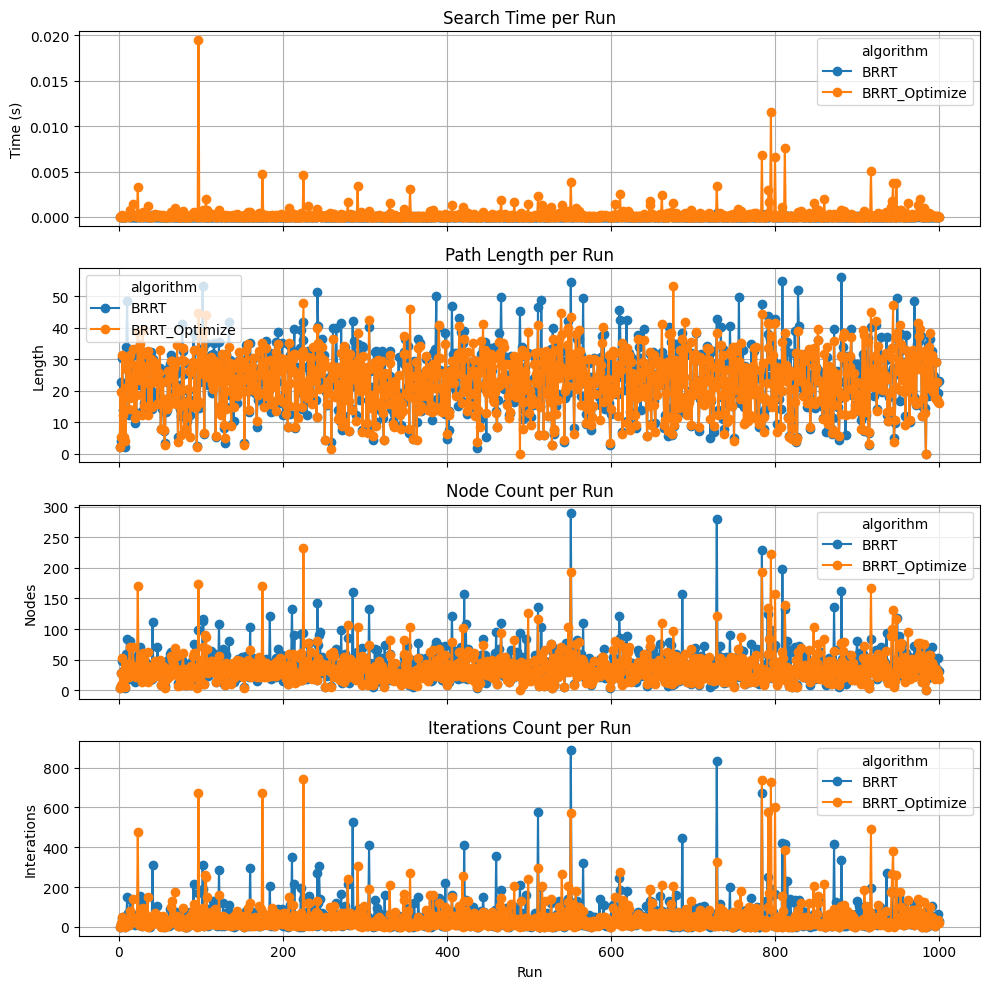

File: ./data/brrt_output0.3-1.5|0.6-0.4--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.10866655240223944


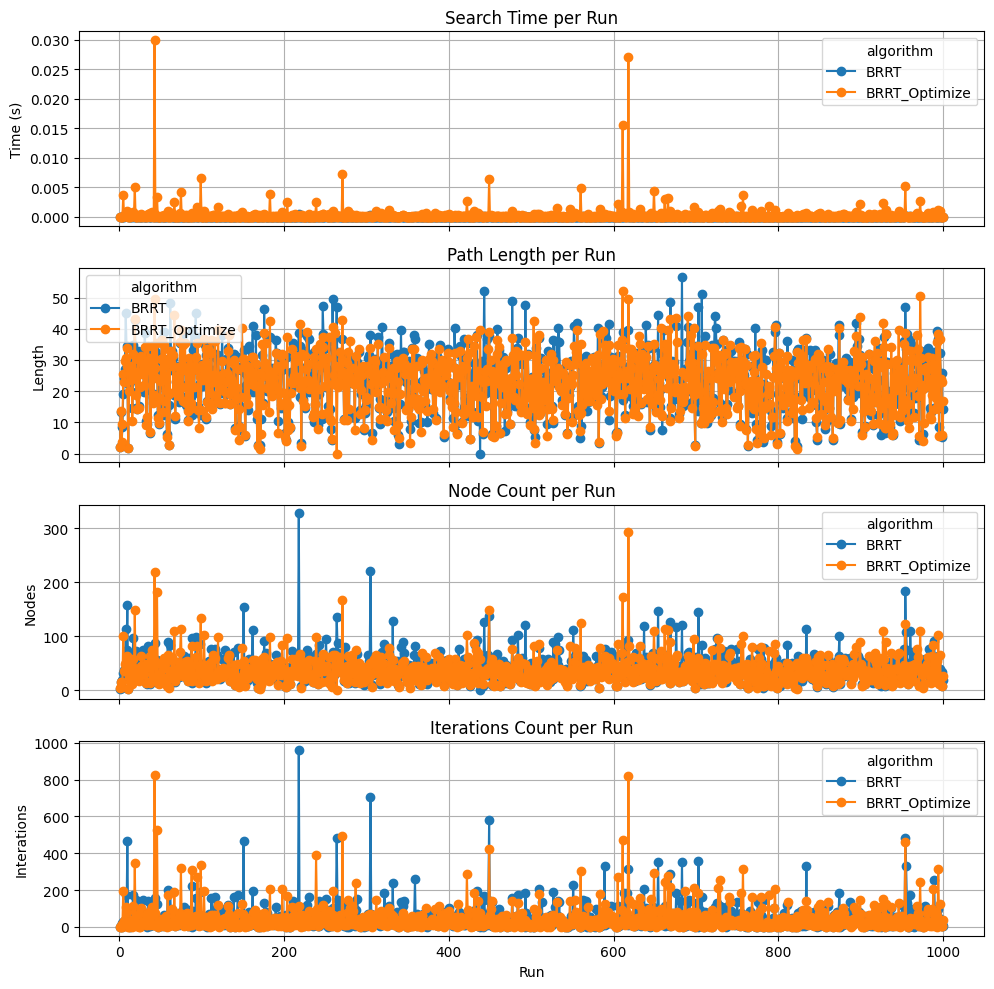

File: ./data/brrt_output0.5-4.0|0.2-0.4-0.4.json, BRRT_Optimize_score: 4.0, Diff: 0.10726975957444917


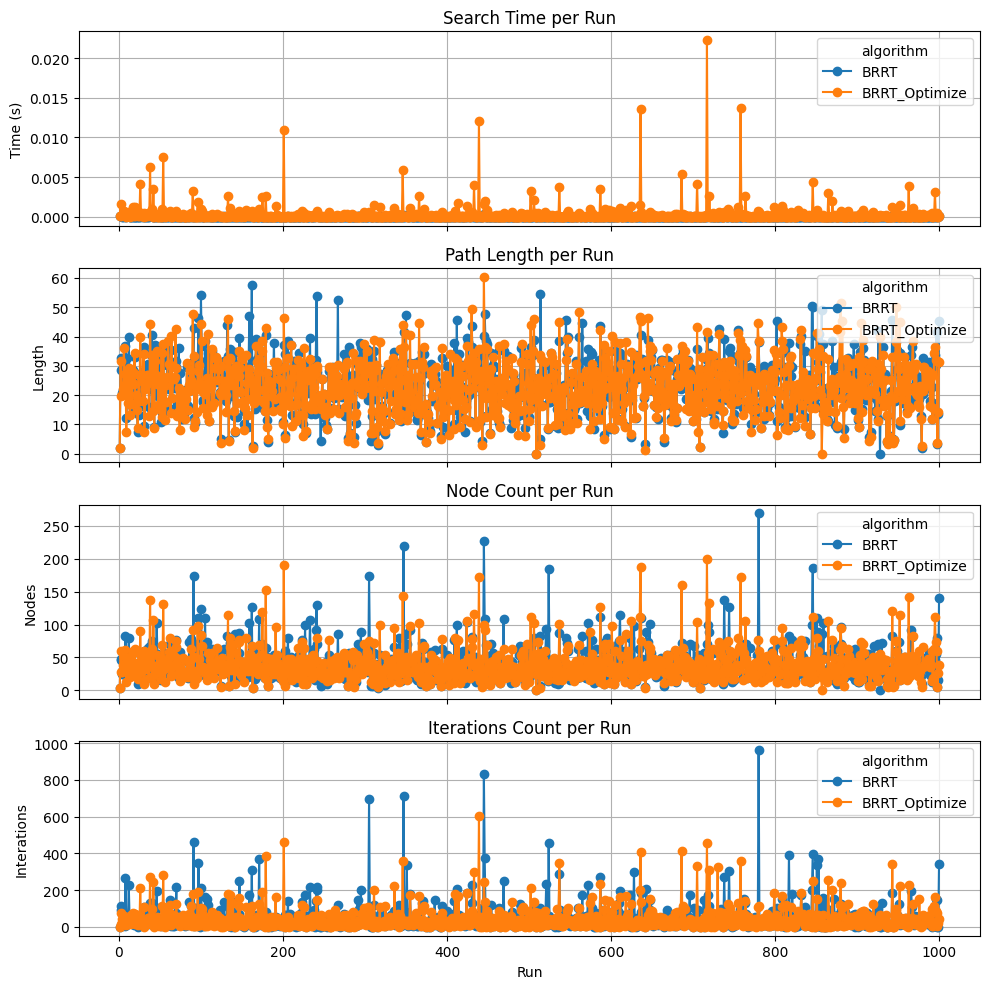

File: ./data/brrt_output0.3-1.5|0.4-0.2-0.4.json, BRRT_Optimize_score: 4.0, Diff: 0.10274570846011377


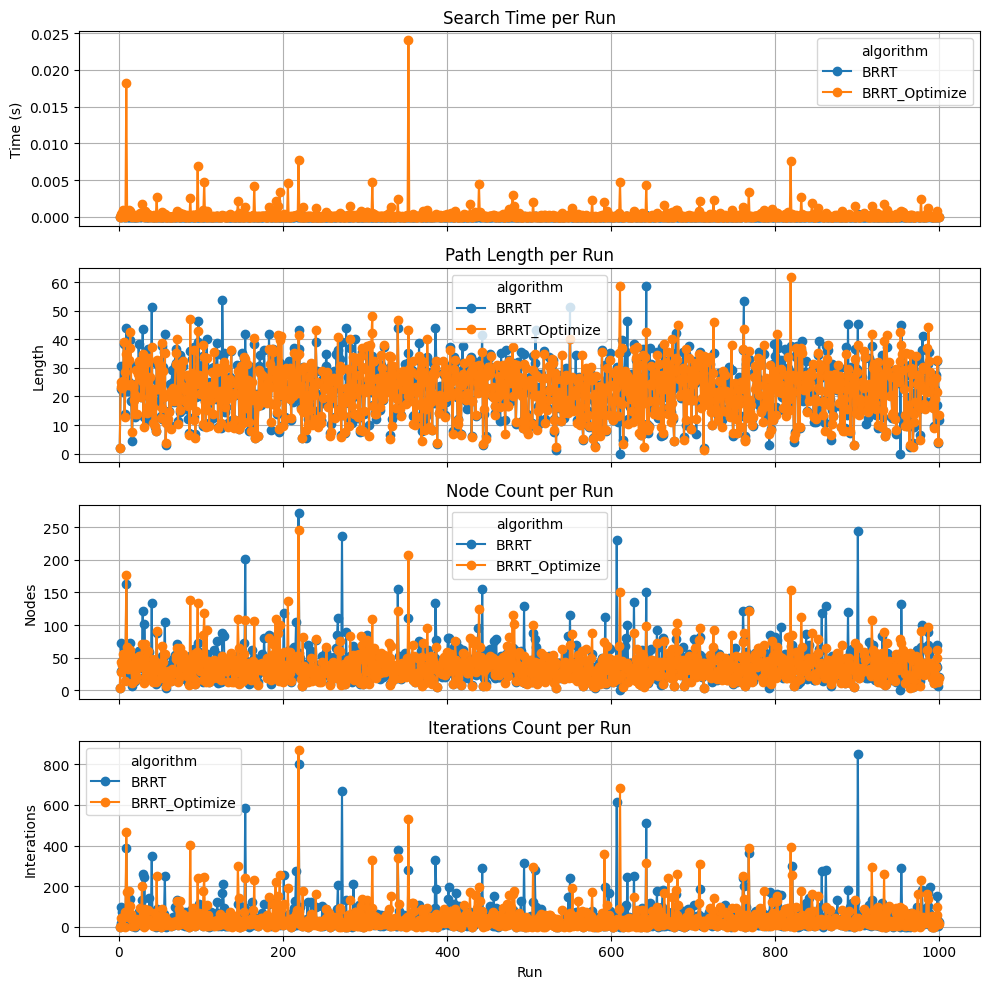

File: ./data/brrt_output0.3-2.0|0.6-0.2-0.2.json, BRRT_Optimize_score: 4.0, Diff: 0.09986588805159258


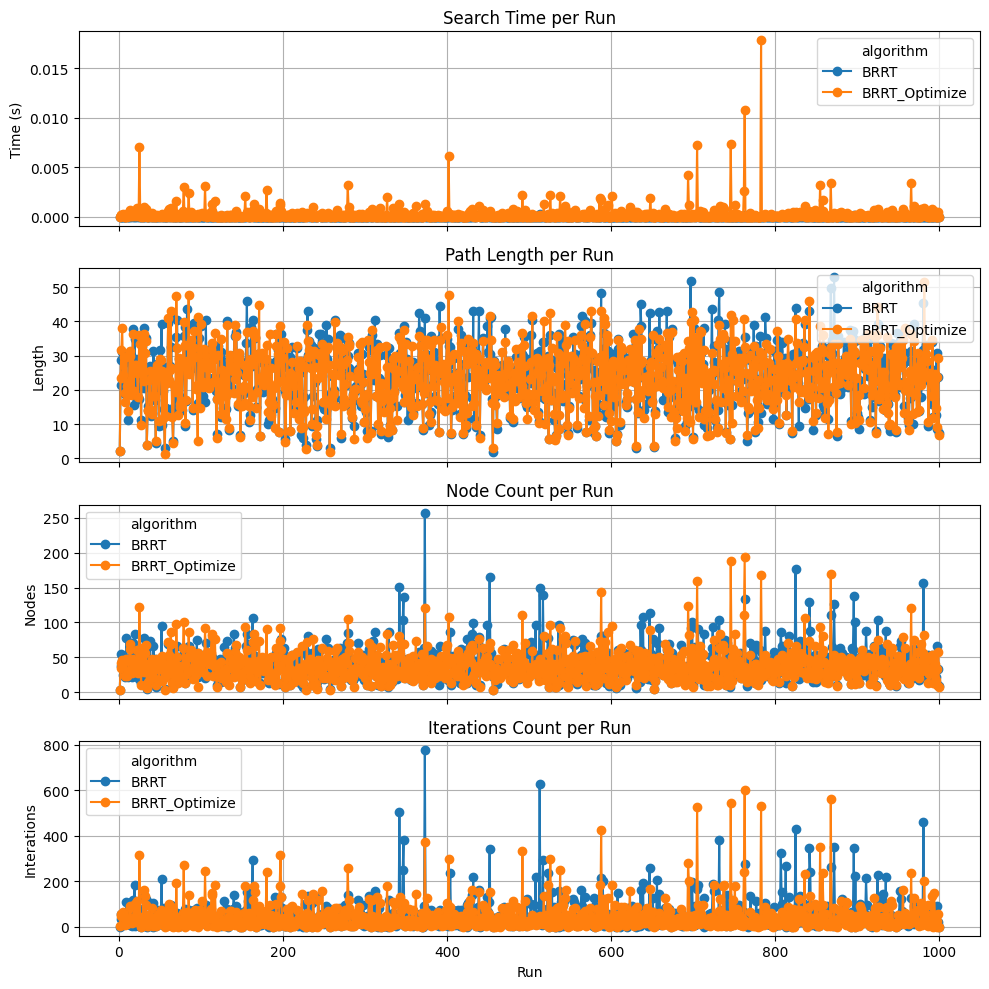

File: ./data/brrt_output0.3-10.0|0.4-0.4-0.2.json, BRRT_Optimize_score: 3.9979939819458377, Diff: 0.09927744657377868


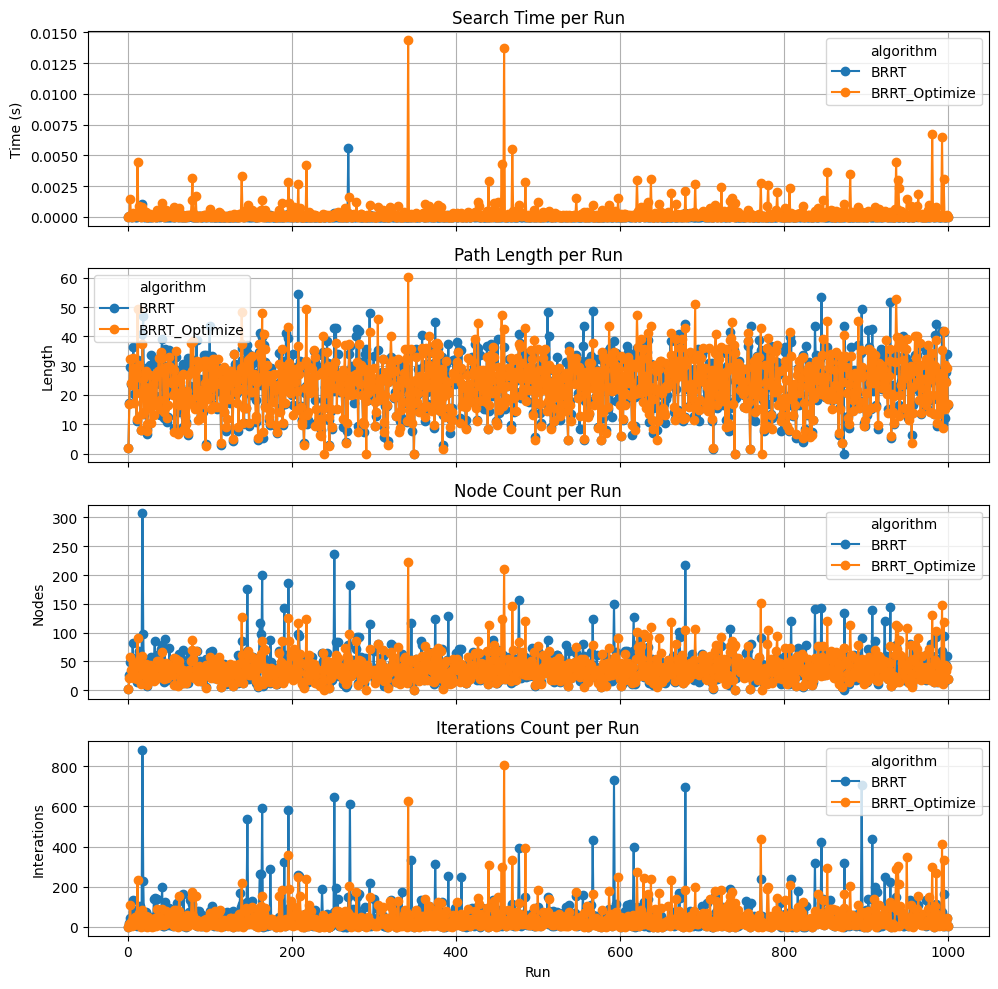

File: ./data/brrt_output0.5-8.0|0.4-0.4-0.2.json, BRRT_Optimize_score: 4.0, Diff: 0.09412372700054039


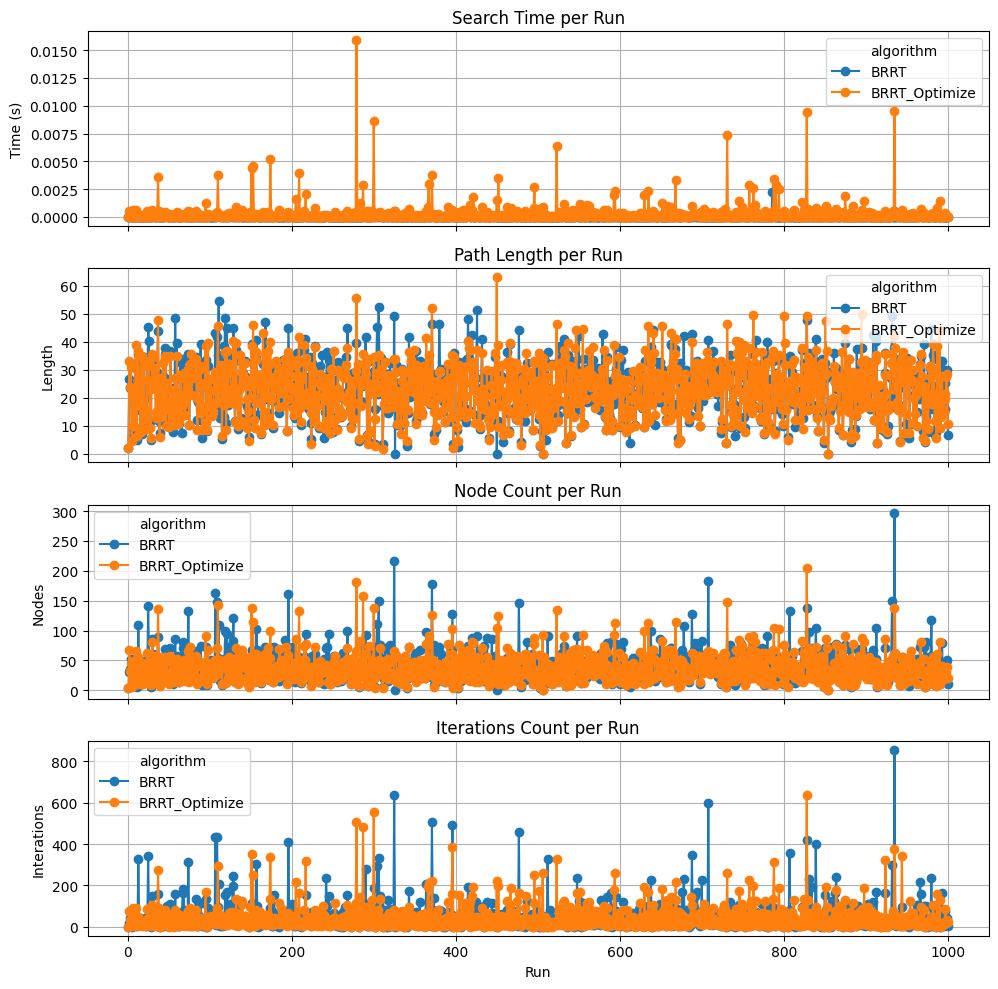

File: ./data/brrt_output0.5-8.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 3.9981056840598788, Diff: 0.09192067862679654


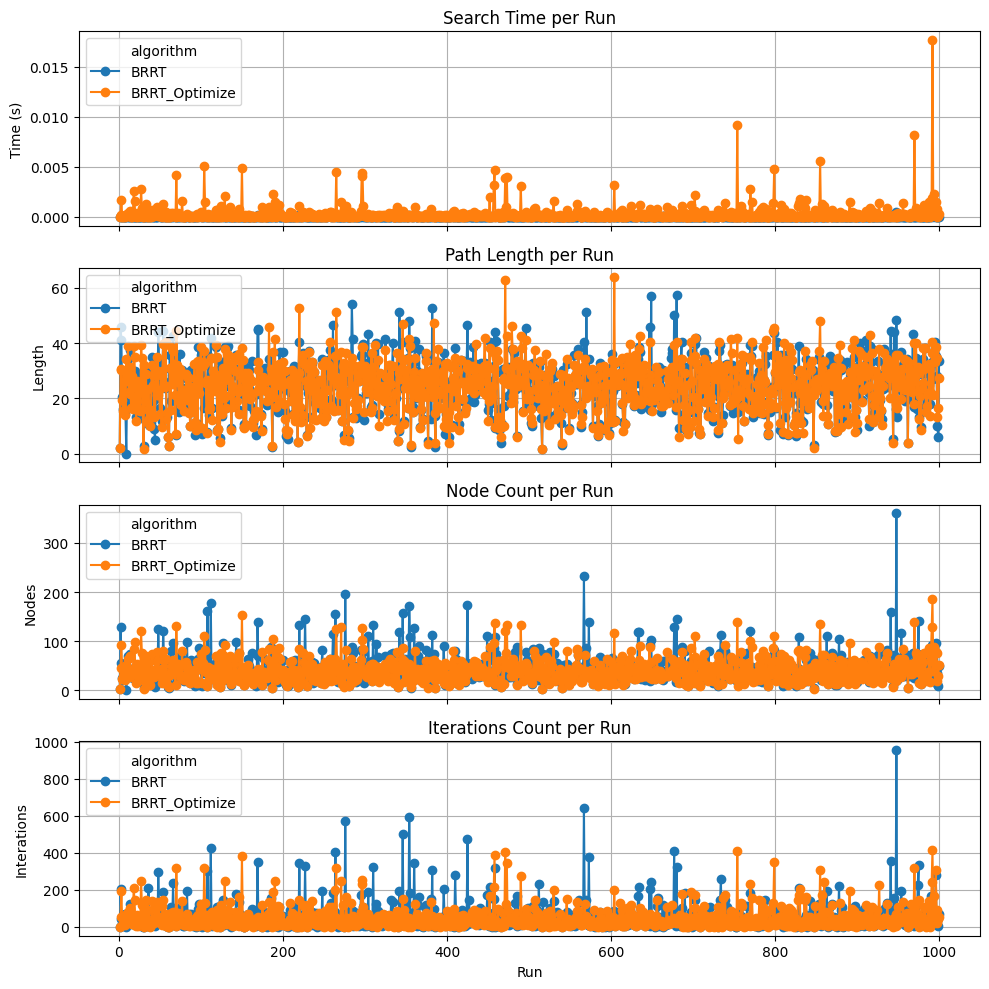

File: ./data/brrt_output0.3-6.0|0.2-0.6-0.2.json, BRRT_Optimize_score: 4.0, Diff: 0.08580966472616236


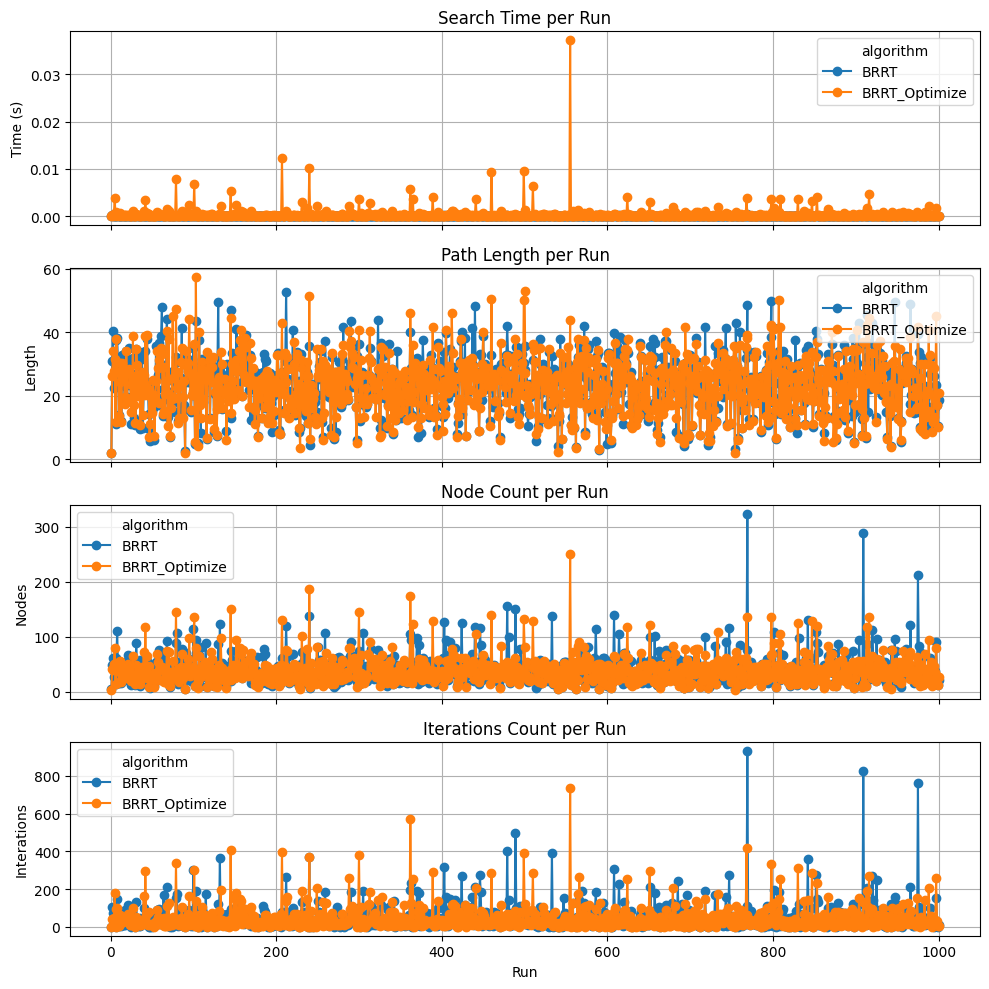

File: ./data/brrt_output0.3-4.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.08418333436050762


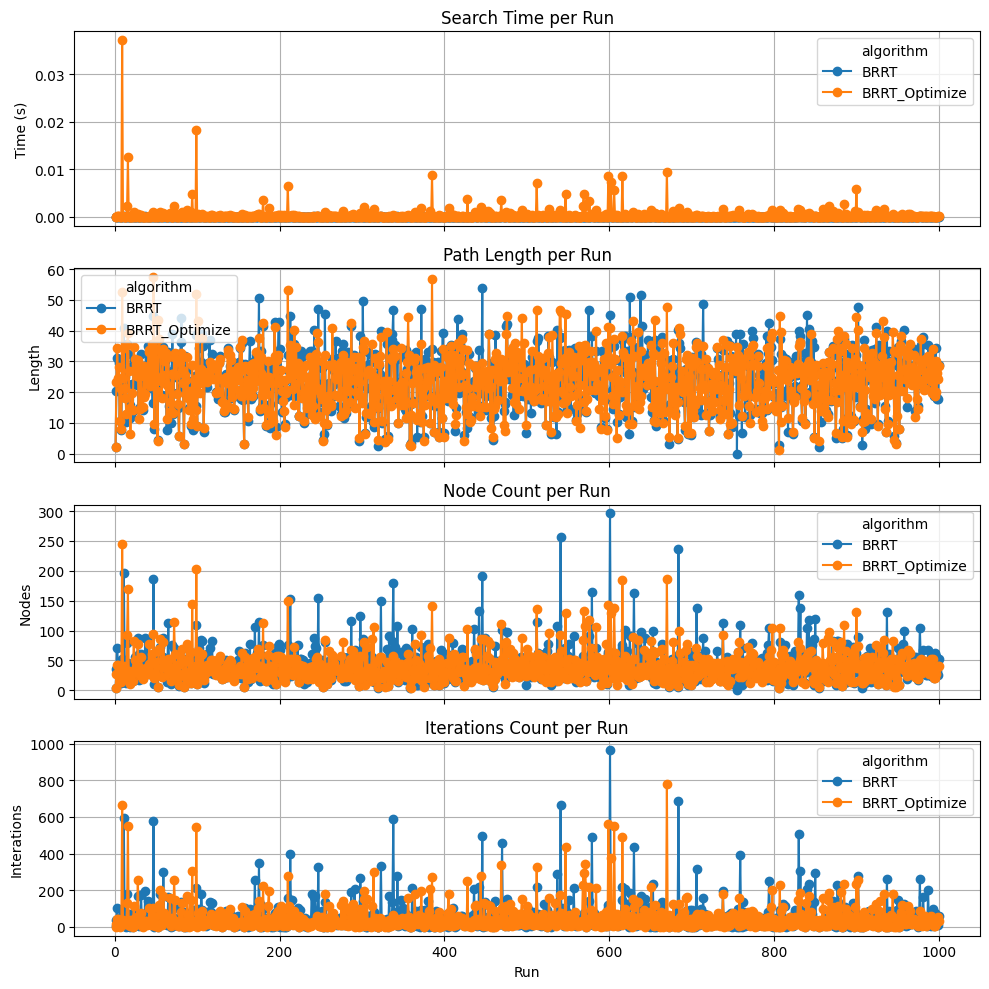

File: ./data/brrt_output0.5-8.0|0.2-0.2-0.6.json, BRRT_Optimize_score: 3.997991967871486, Diff: 0.08326785301421369


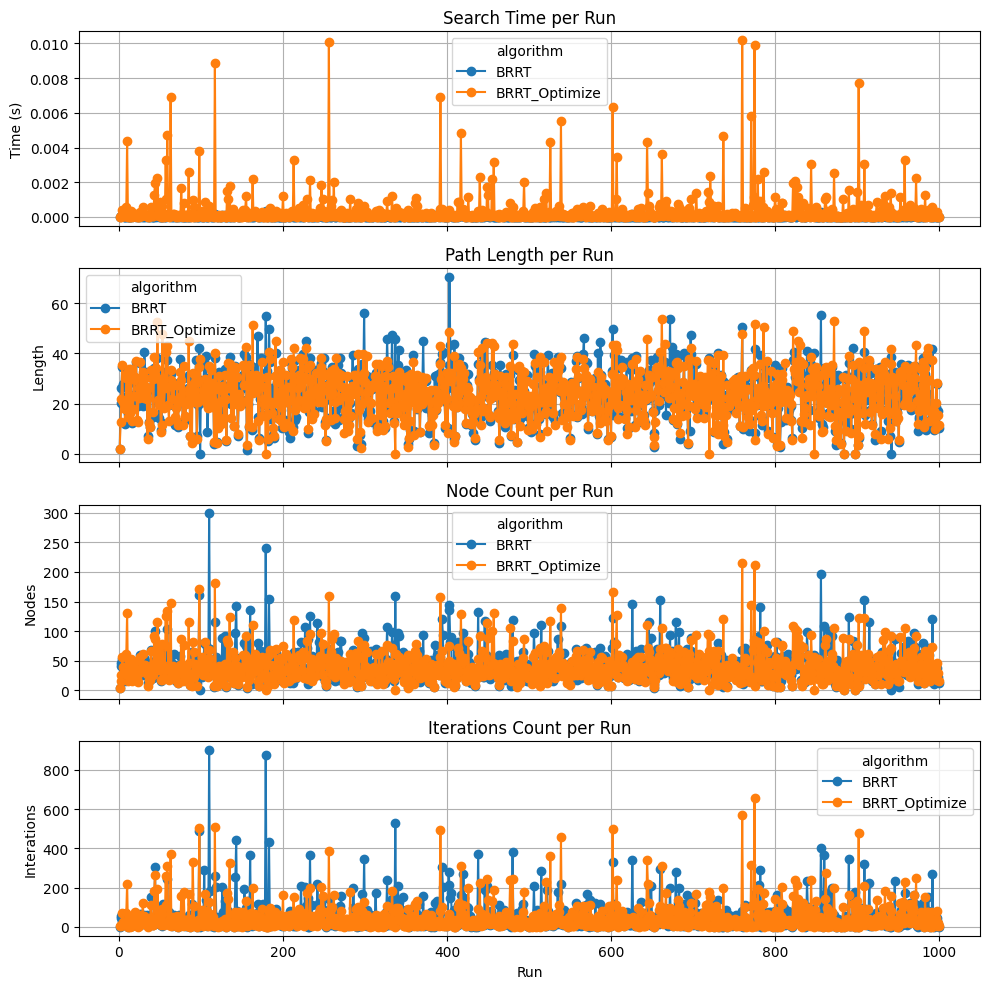

File: ./data/brrt_output0.3-1.5|0.8-0.2--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.07934387806103693


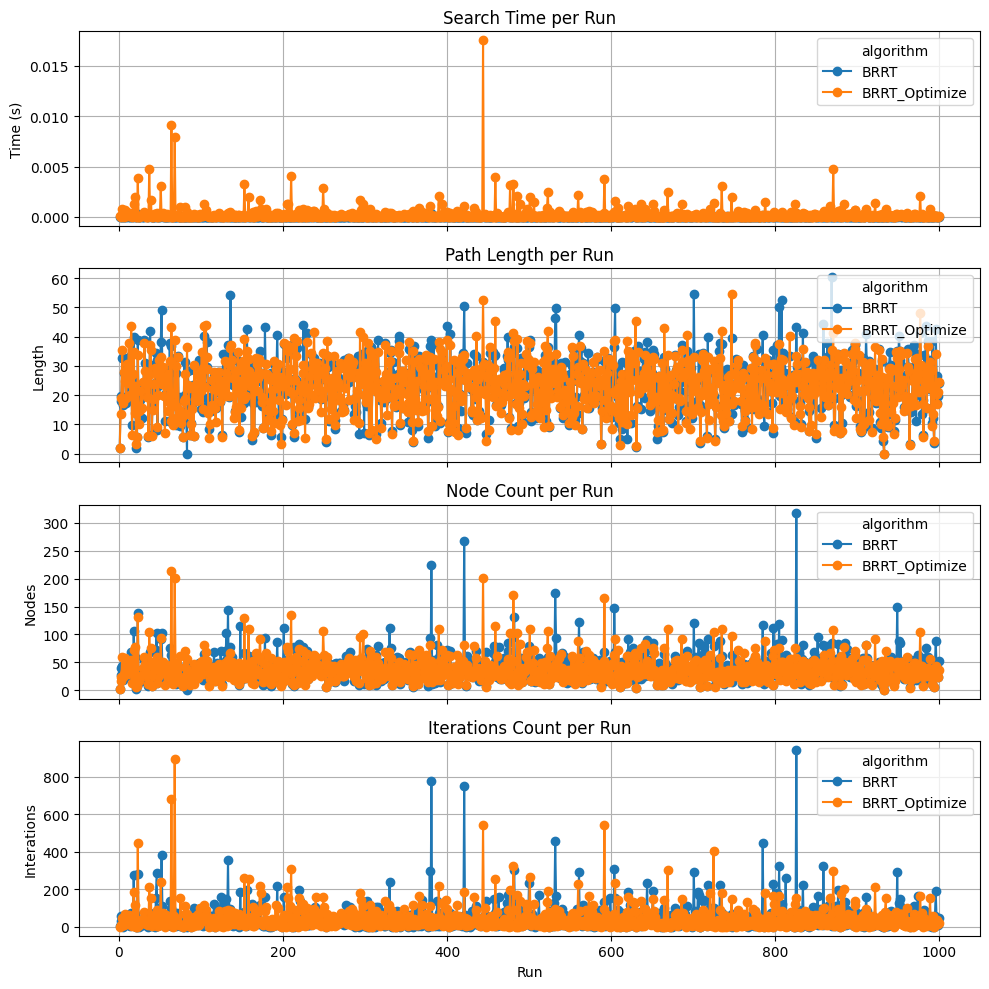

File: ./data/brrt_output0.5-4.0|0.4-0.2-0.4.json, BRRT_Optimize_score: 3.998997995991984, Diff: 0.07723631290271626


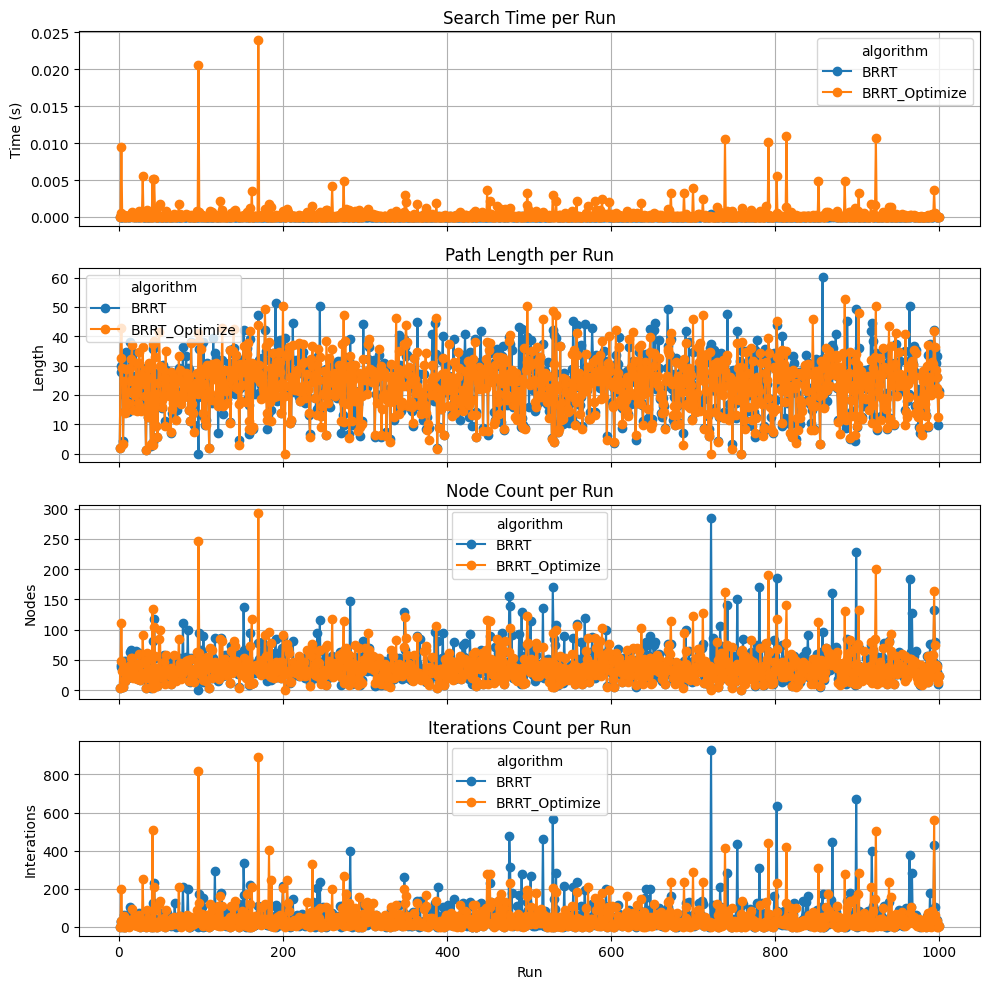

File: ./data/brrt_output0.3-1.5|0.2-0.6-0.2.json, BRRT_Optimize_score: 3.983397890418986, Diff: 0.07644351148852468


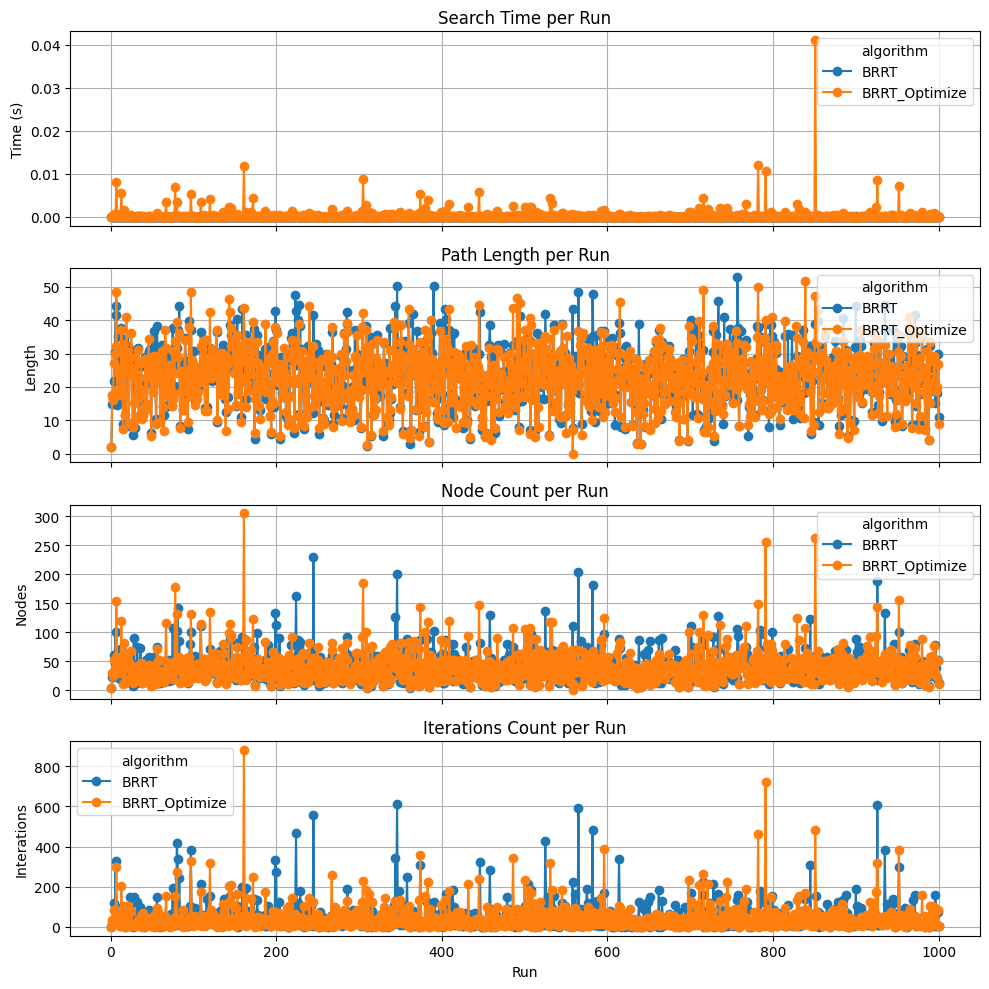

File: ./data/brrt_output0.3-4.0|0.6-0.2-0.2.json, BRRT_Optimize_score: 3.999, Diff: 0.07574420606784527


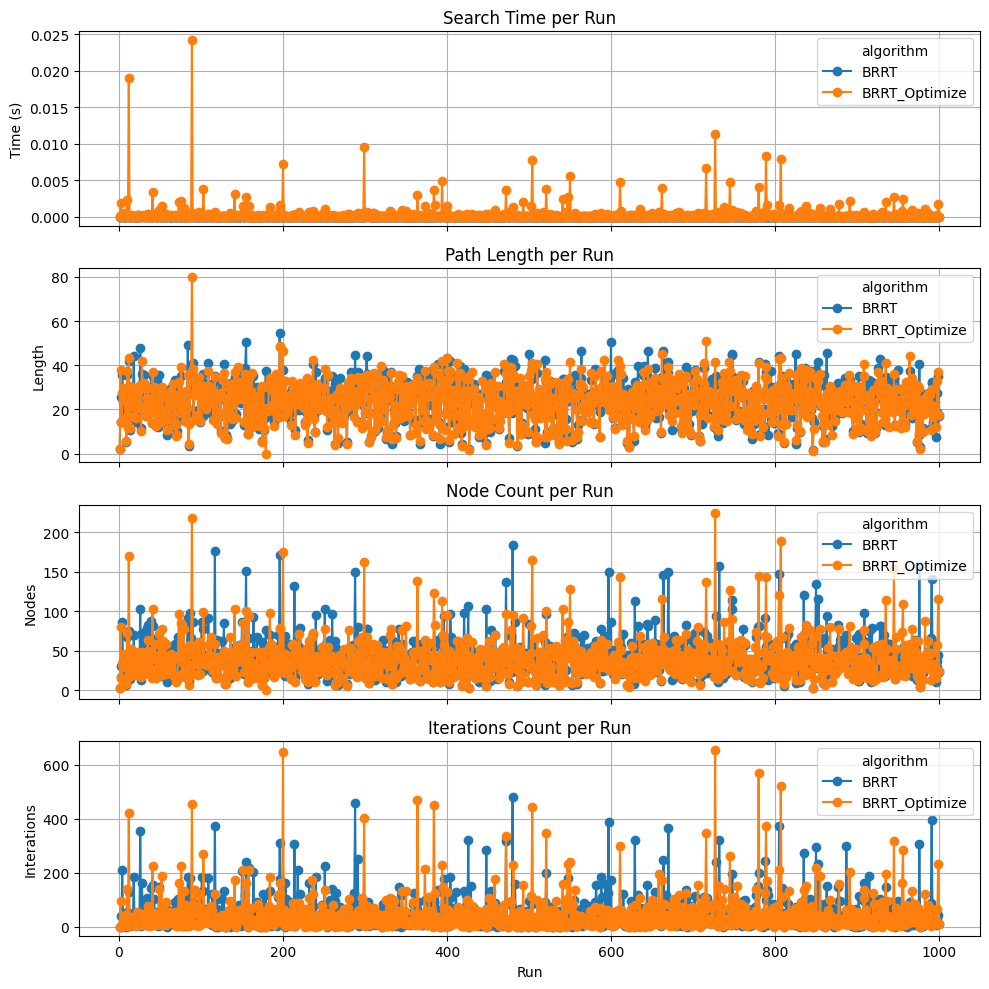

File: ./data/brrt_output0.5-8.0|0.2-0.4-0.4.json, BRRT_Optimize_score: 4.0, Diff: 0.07527734950550524


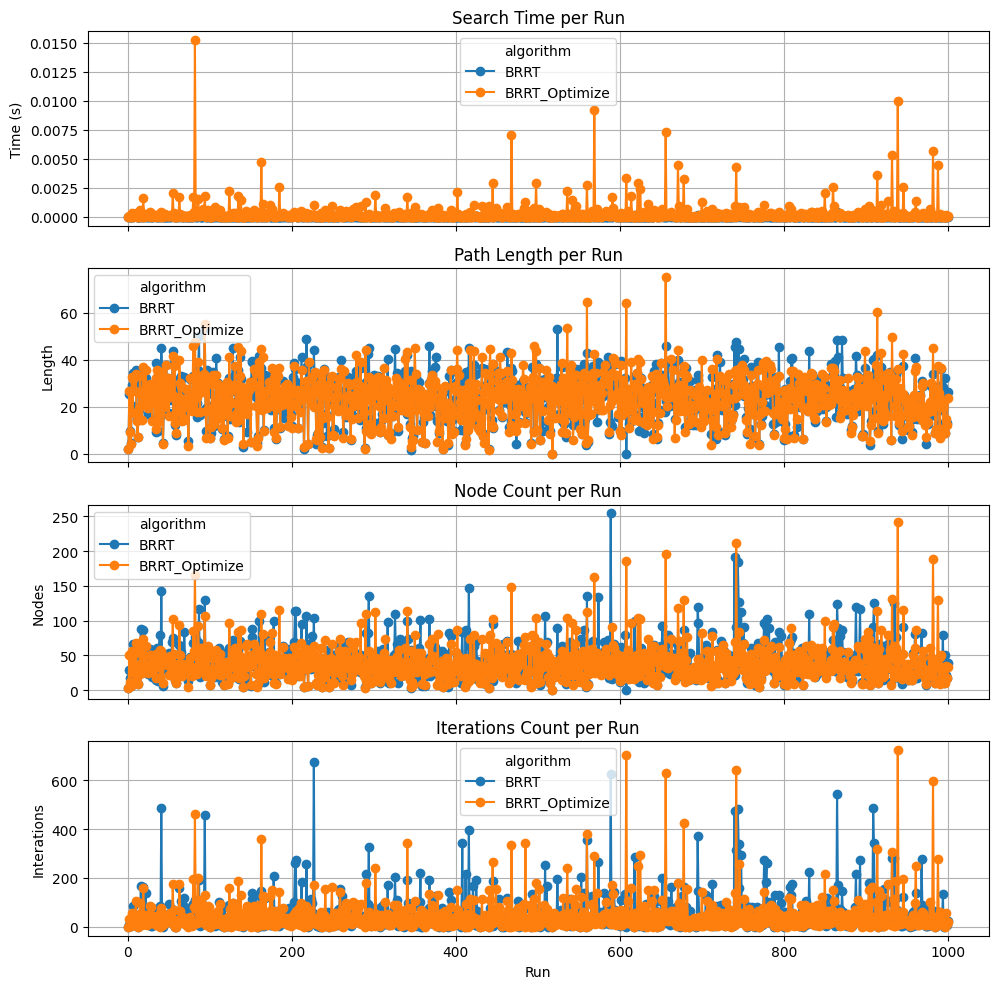

File: ./data/brrt_output0.5-2.0|0.4-0.2-0.4.json, BRRT_Optimize_score: 3.998996990972919, Diff: 0.07471504515493166


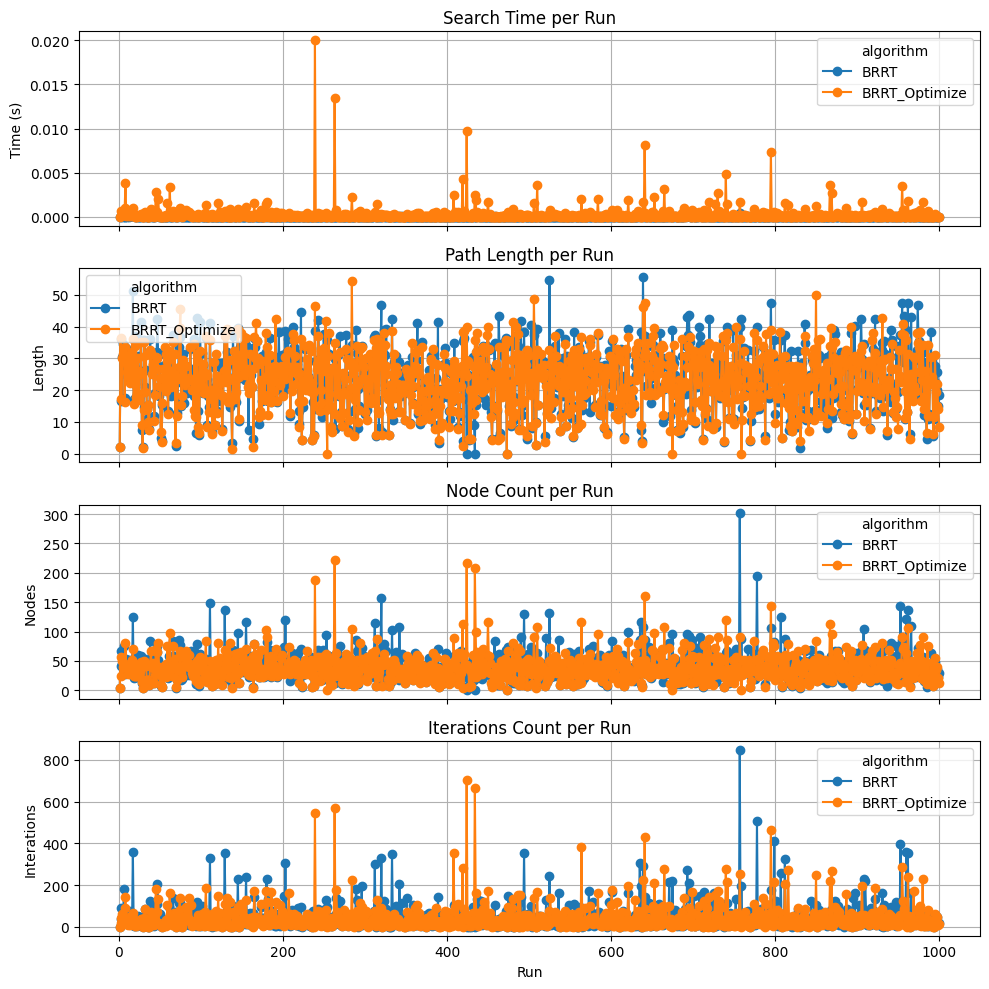

File: ./data/brrt_output0.3-10.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.07231352339538333


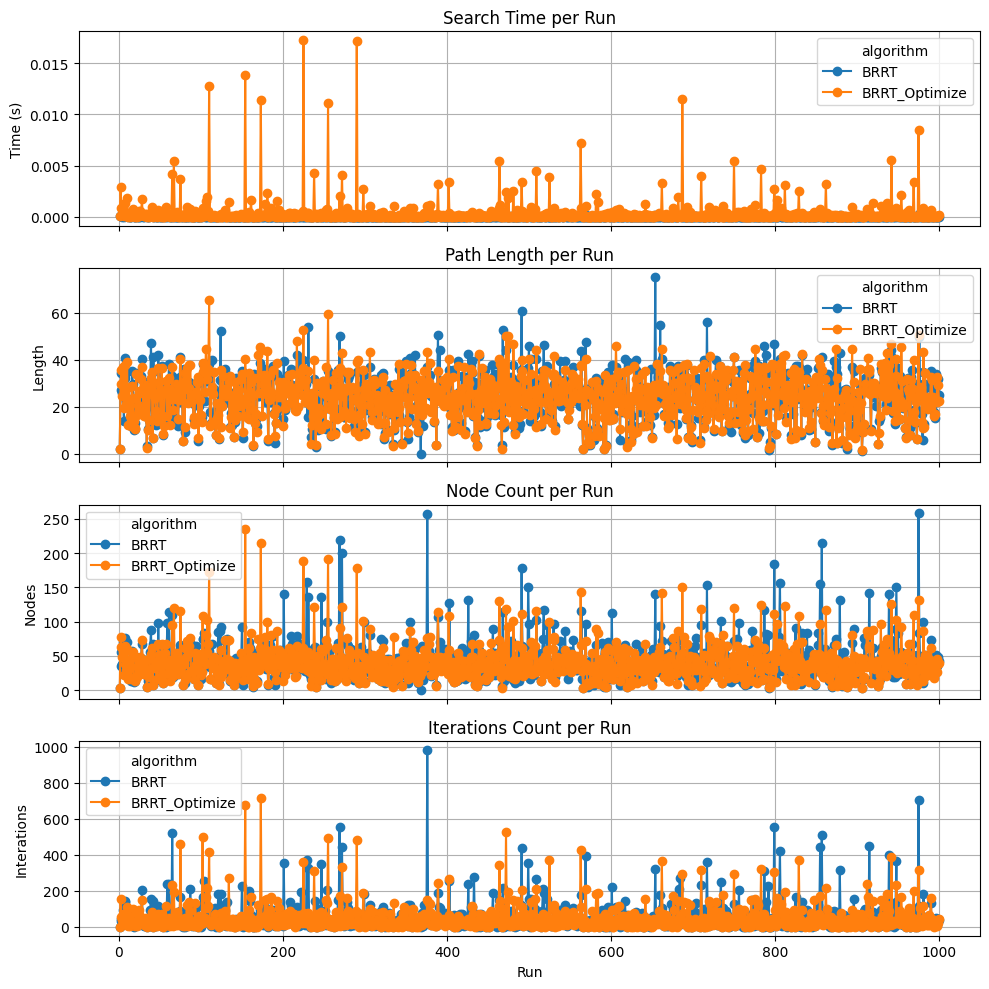

File: ./data/brrt_output0.5-2.0|0.4-0.4-0.2.json, BRRT_Optimize_score: 3.9949368553988633, Diff: 0.0712501015010476


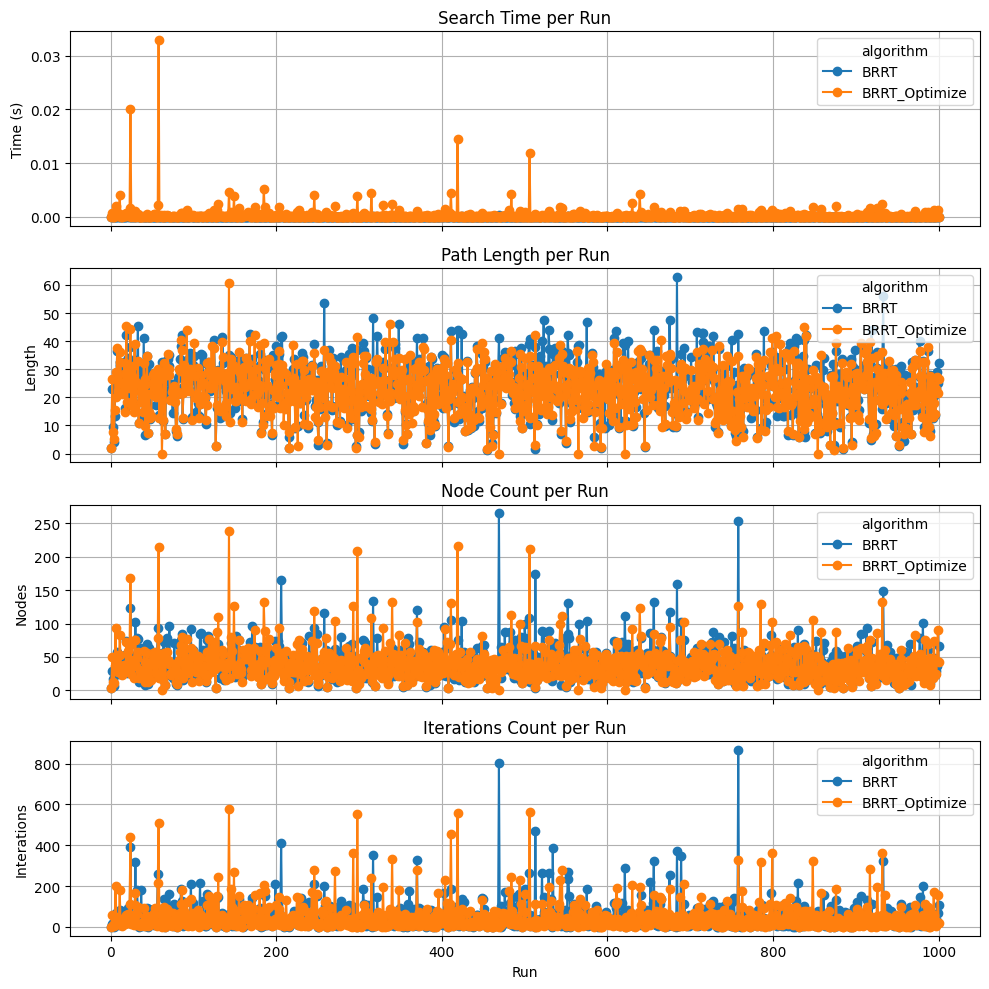

File: ./data/brrt_output0.3-2.0|0.2-0.4-0.4.json, BRRT_Optimize_score: 3.9865344700867267, Diff: 0.06549326447824688


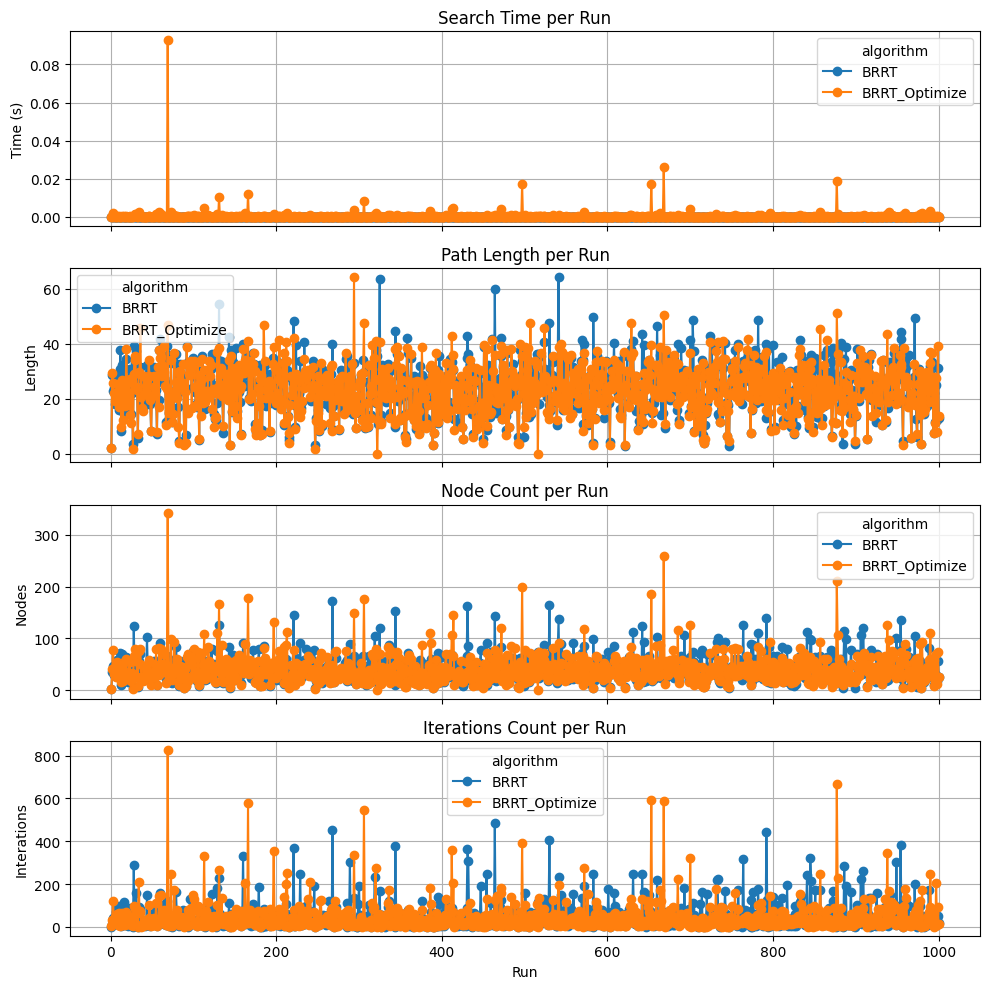

File: ./data/brrt_output0.5-2.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 3.9801068767796544, Diff: 0.05801844114514809


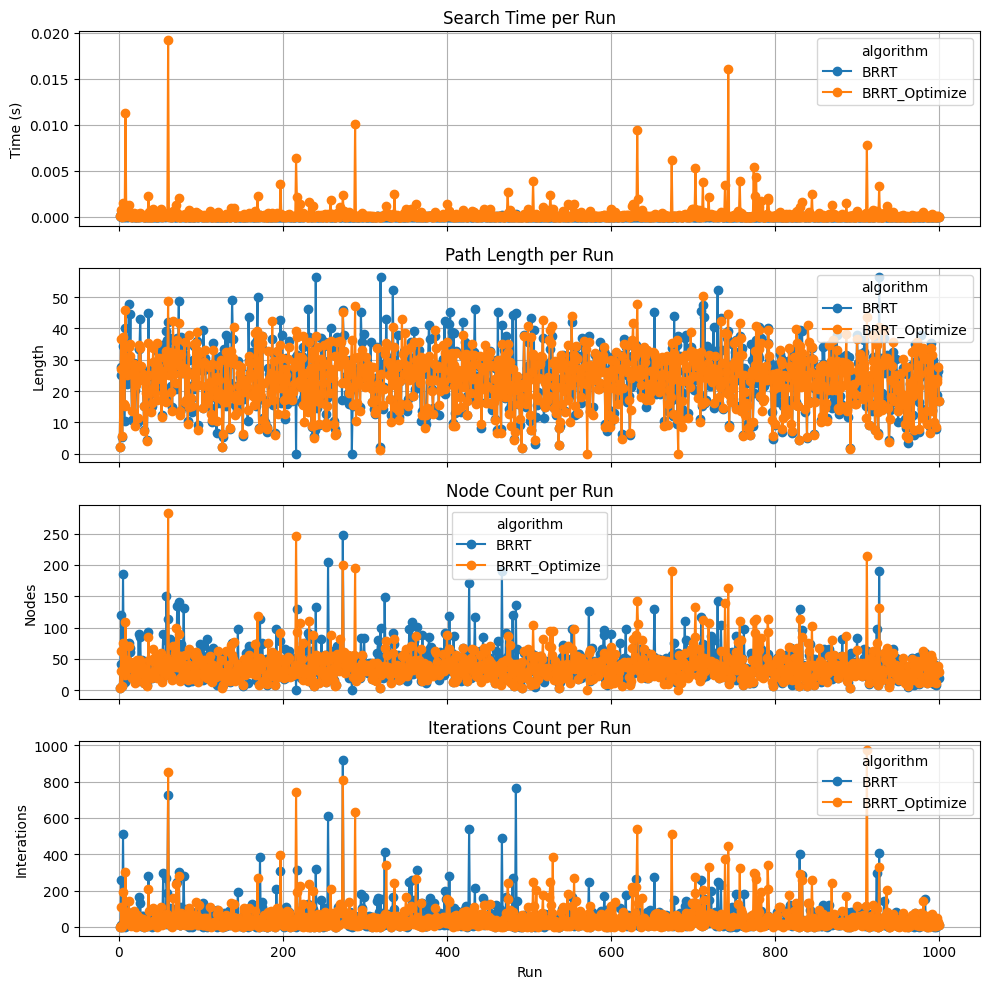

File: ./data/brrt_output0.3-2.0|0.2-0.6-0.2.json, BRRT_Optimize_score: 3.9751337664819415, Diff: 0.05401170032874125


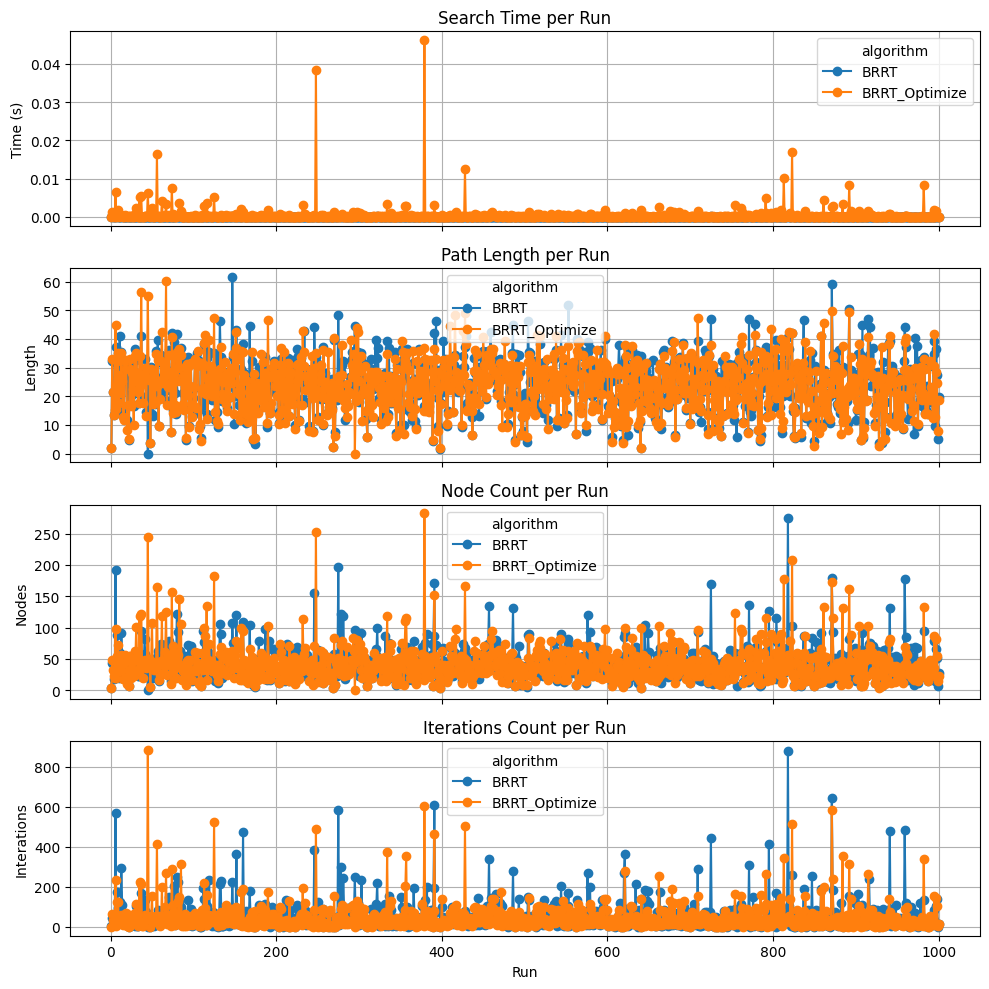

File: ./data/brrt_output0.5-8.0|0.2-0.8-0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.05159718018697523


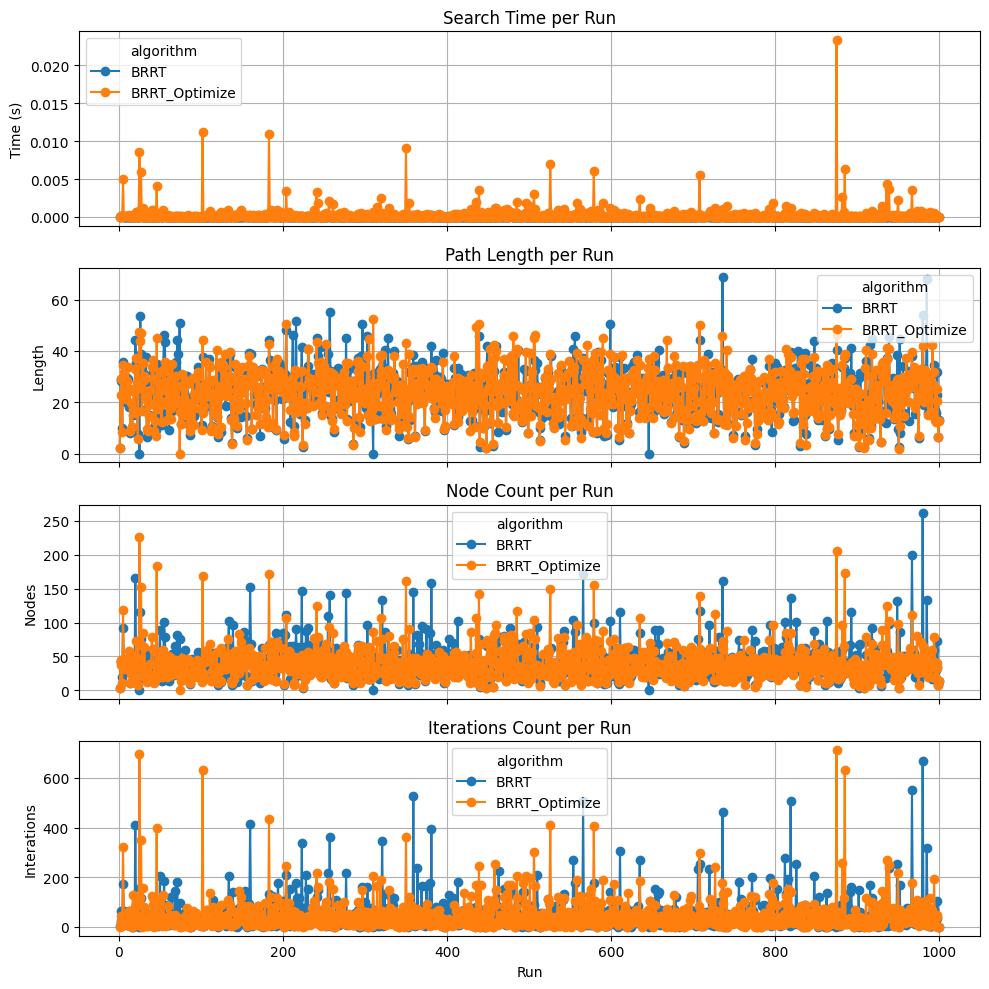

File: ./data/brrt_output0.3-8.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 3.993362453916077, Diff: 0.05047520193277766


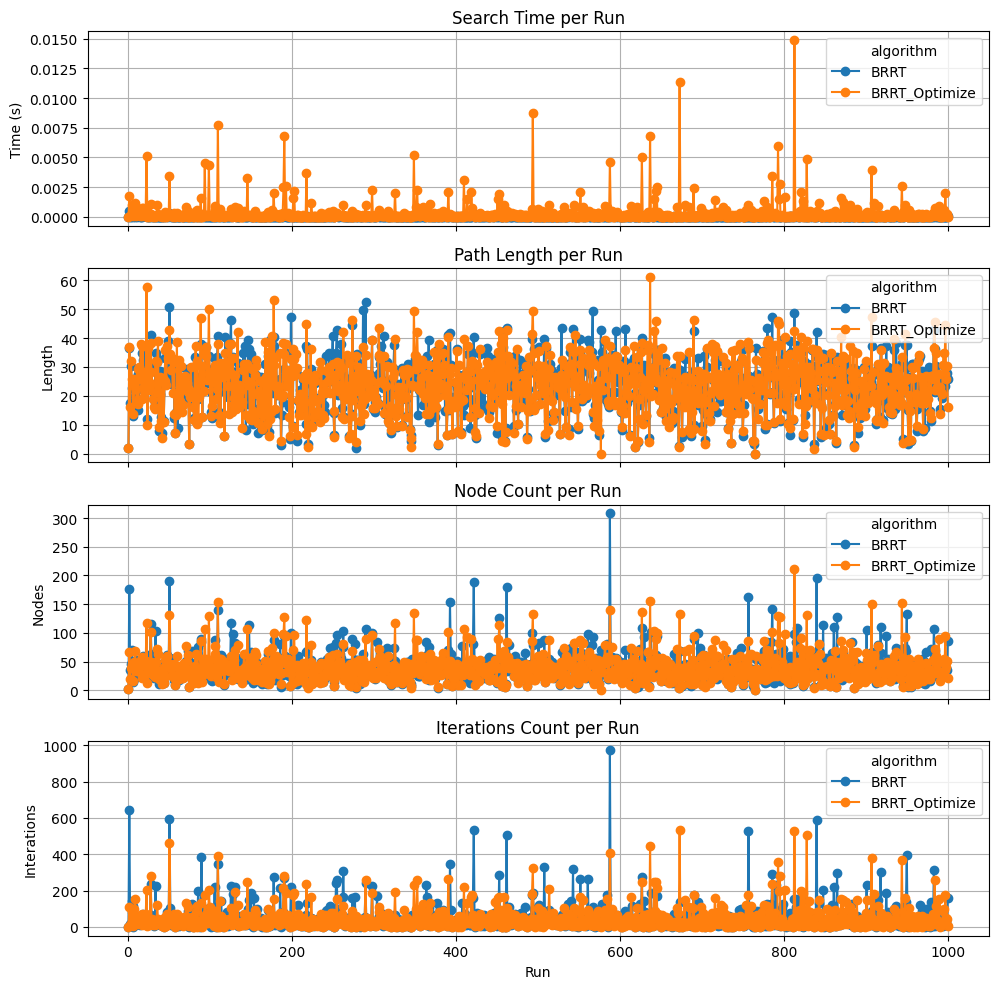

File: ./data/brrt_output0.3-8.0|0.6-0.4--0.0.json, BRRT_Optimize_score: 3.999029145249331, Diff: 0.047057991473091754


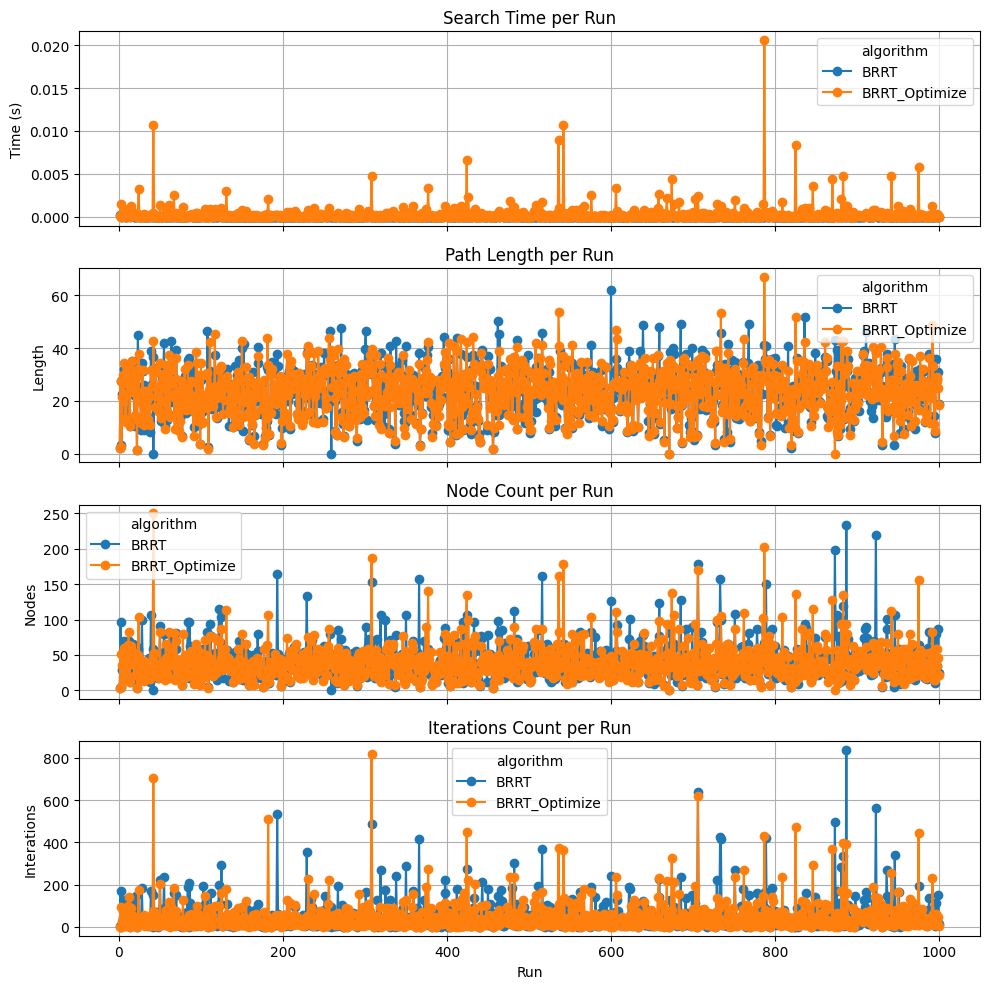

File: ./data/brrt_output0.3-1.5|0.2-0.4-0.4.json, BRRT_Optimize_score: 3.9494634101211954, Diff: 0.044955942299024


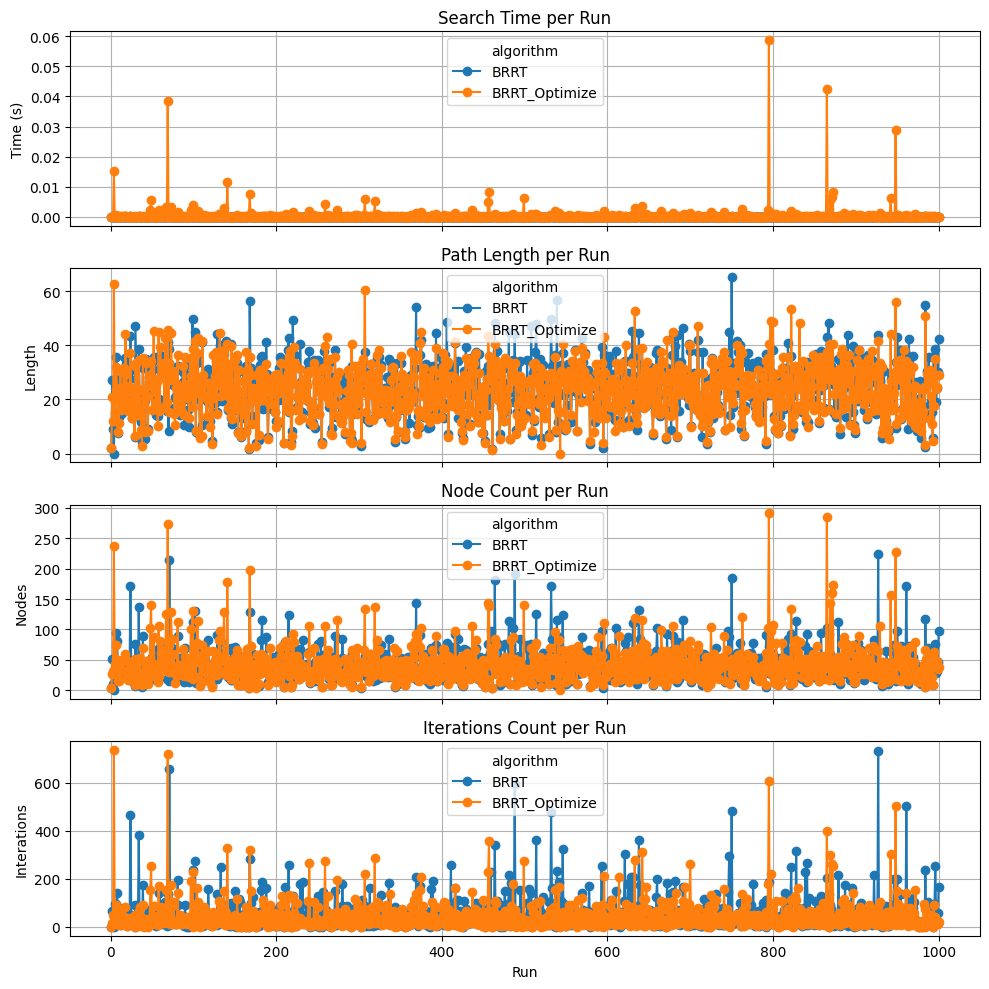

File: ./data/brrt_output0.3-10.0|0.4-0.6--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.03579824902012163


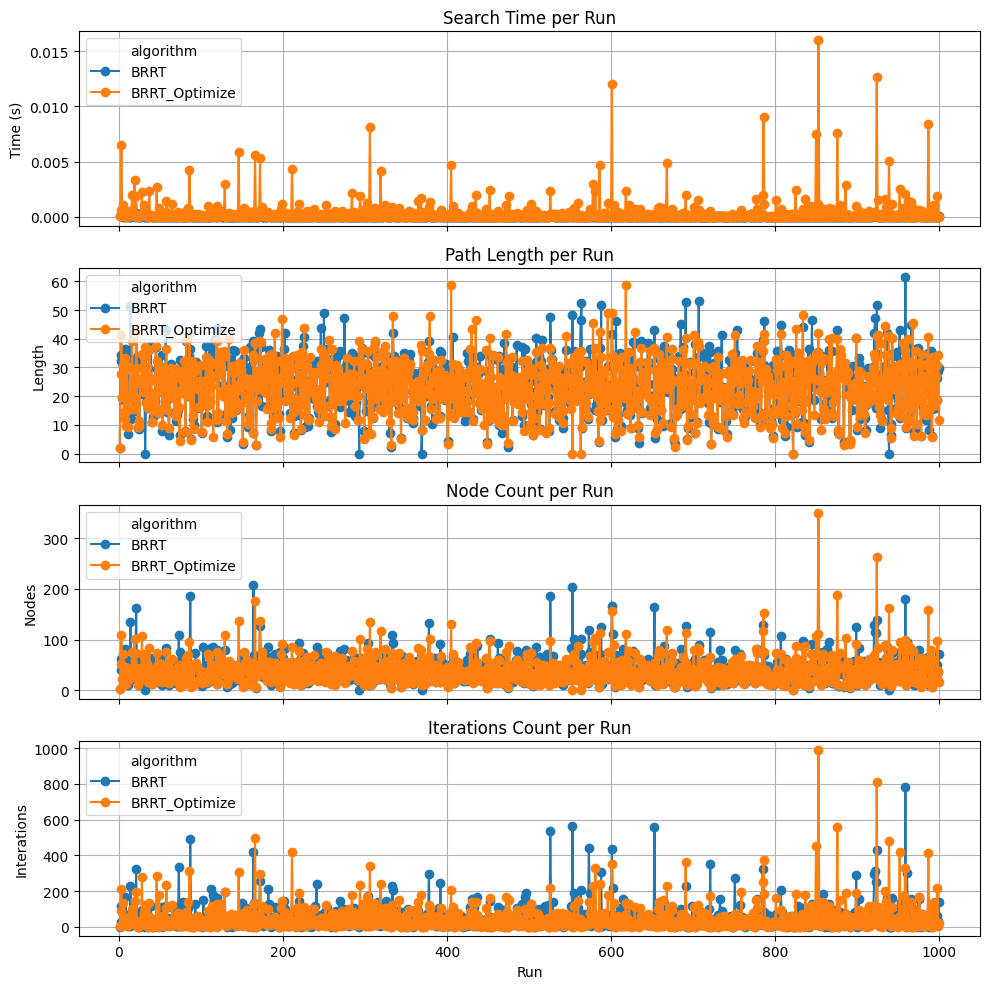

File: ./data/brrt_output0.3-8.0|0.2-0.4-0.4.json, BRRT_Optimize_score: 3.998998998998999, Diff: 0.03578300039637927


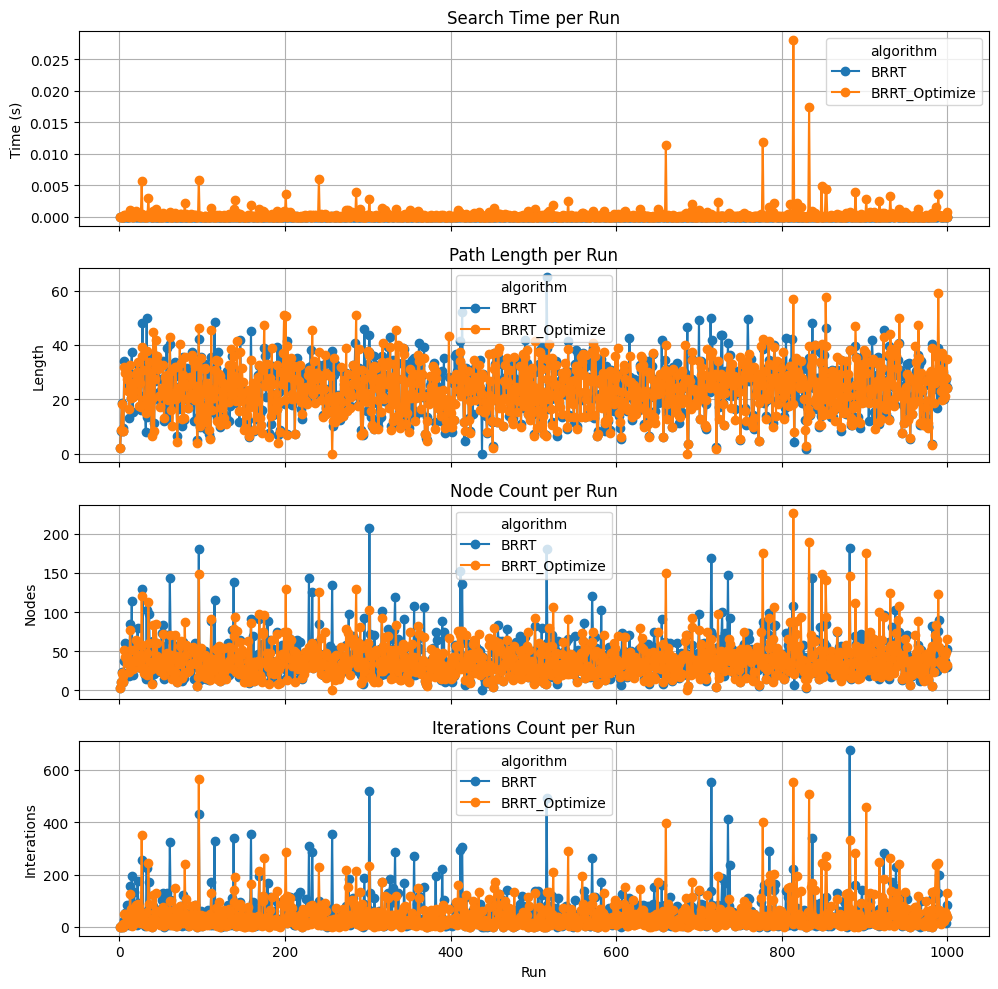

File: ./data/brrt_output0.3-8.0|0.2-0.6-0.2.json, BRRT_Optimize_score: 4.0, Diff: 0.03571901987273973


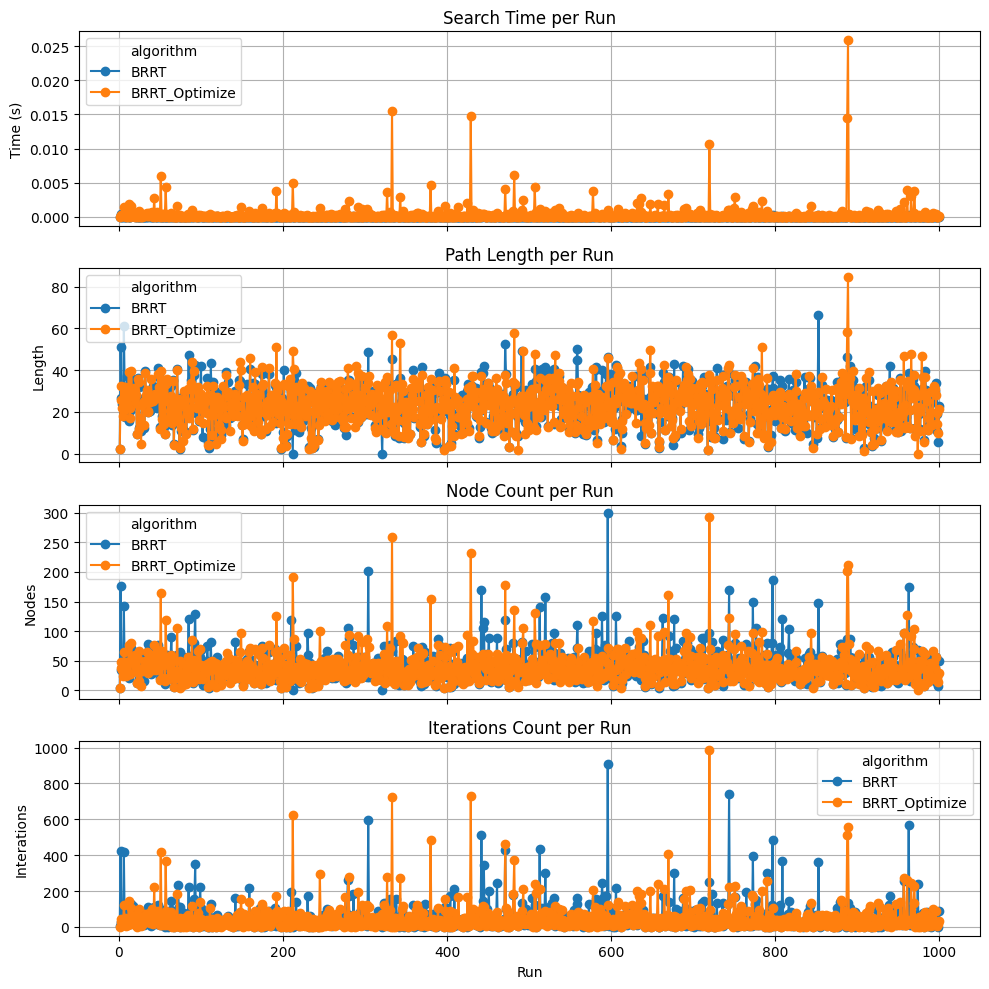

File: ./data/brrt_output0.5-4.0|0.4-0.4-0.2.json, BRRT_Optimize_score: 3.999, Diff: 0.027348202794543308


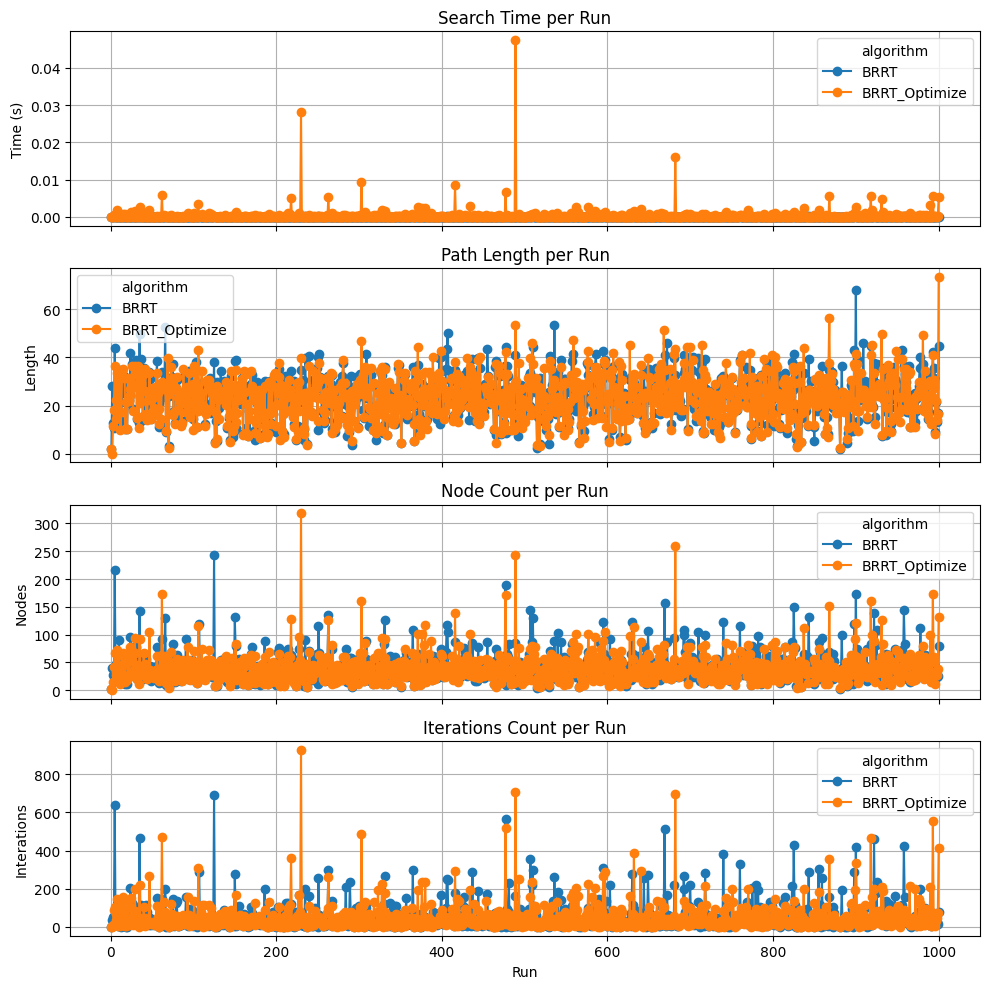

File: ./data/brrt_output0.3-2.0|0.4-0.2-0.4.json, BRRT_Optimize_score: 3.994464827264437, Diff: 0.0253784746372423


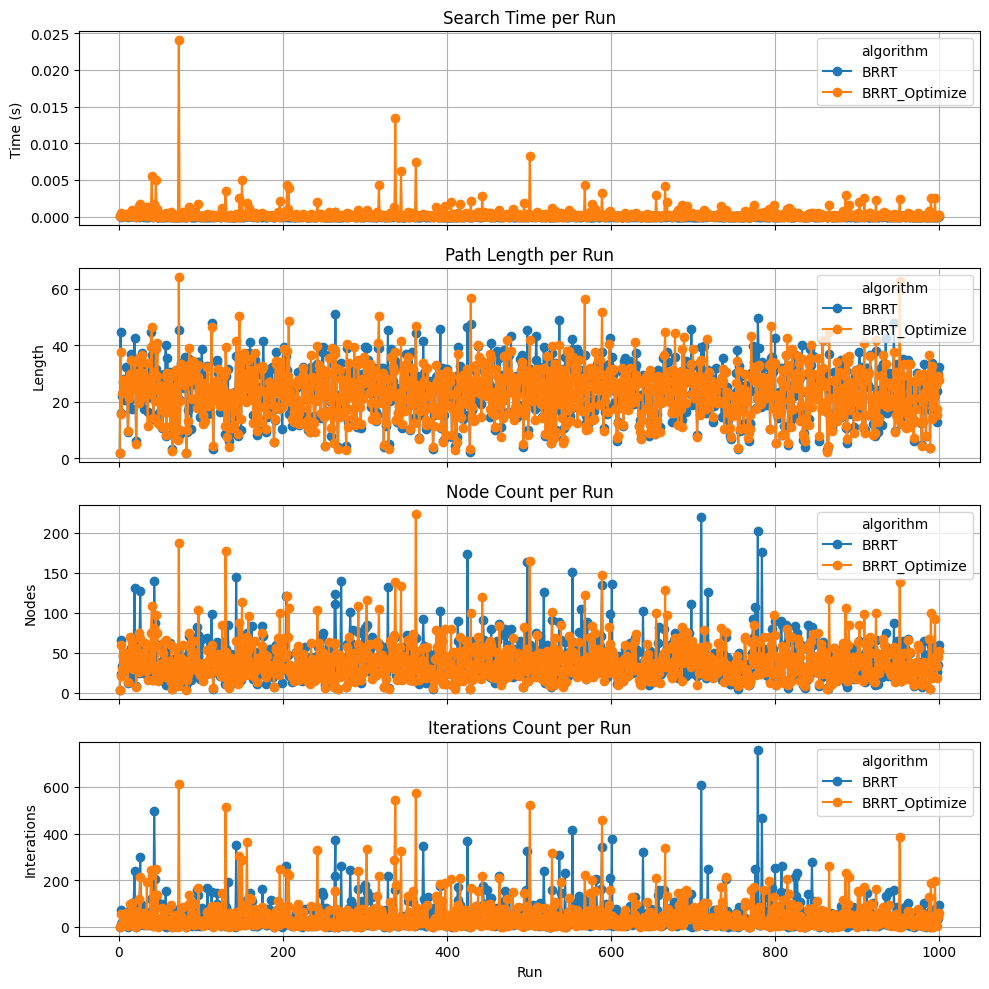

File: ./data/brrt_output0.3-4.0|0.8-0.2--0.0.json, BRRT_Optimize_score: 4.0, Diff: 0.02515147895165004


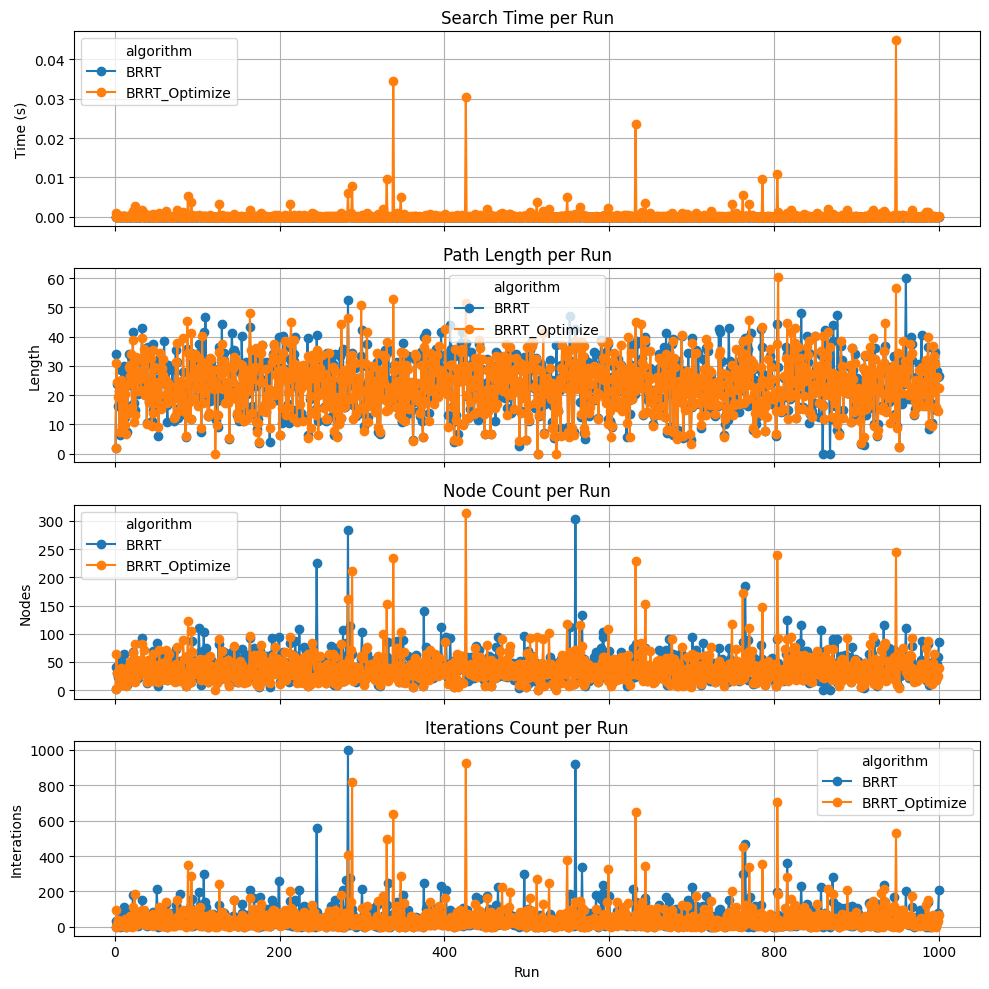

File: ./data/brrt_output0.3-6.0|0.4-0.4-0.2.json, BRRT_Optimize_score: 3.9967193143777733, Diff: 0.020457606720169608


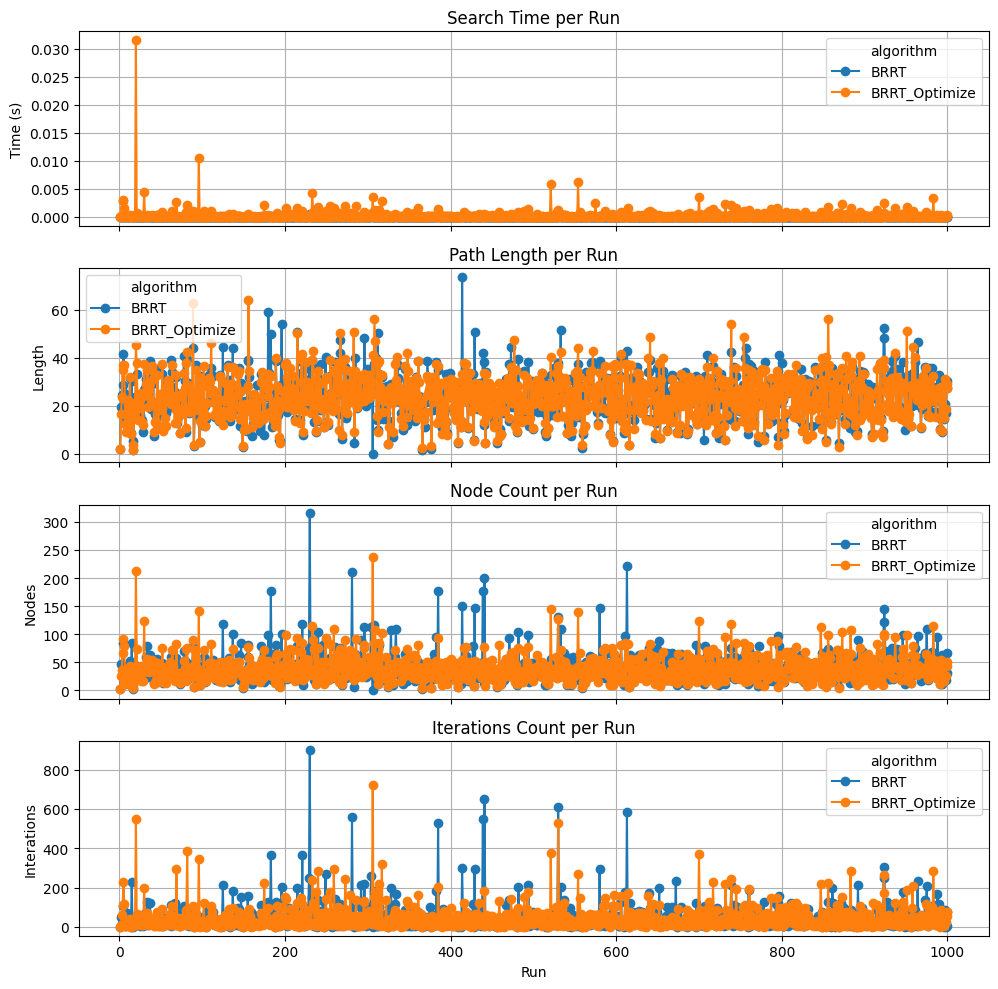

File: ./data/brrt_output0.5-4.0|0.6-0.2-0.2.json, BRRT_Optimize_score: 3.97670273444053, Diff: 0.01889069067021465


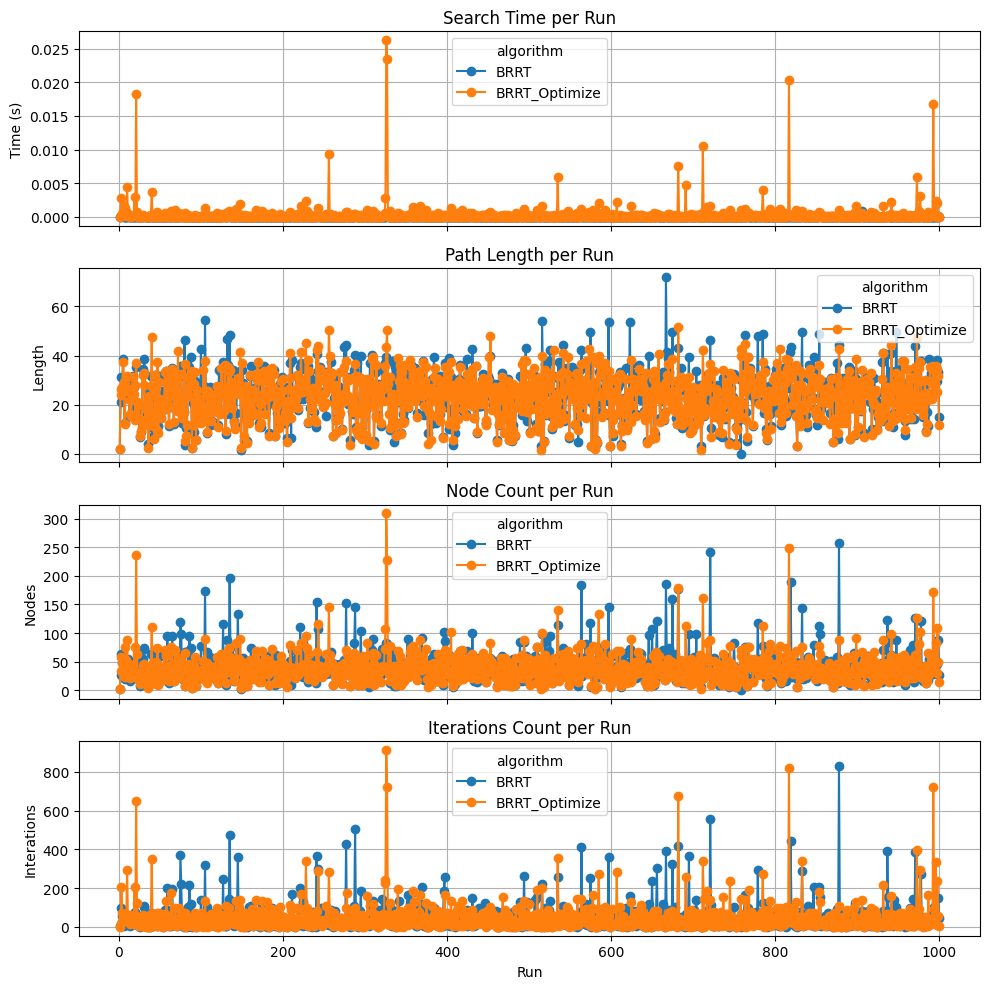

File: ./data/brrt_output0.3-6.0|0.4-0.2-0.4.json, BRRT_Optimize_score: 3.998269692227439, Diff: 0.012229010186900702


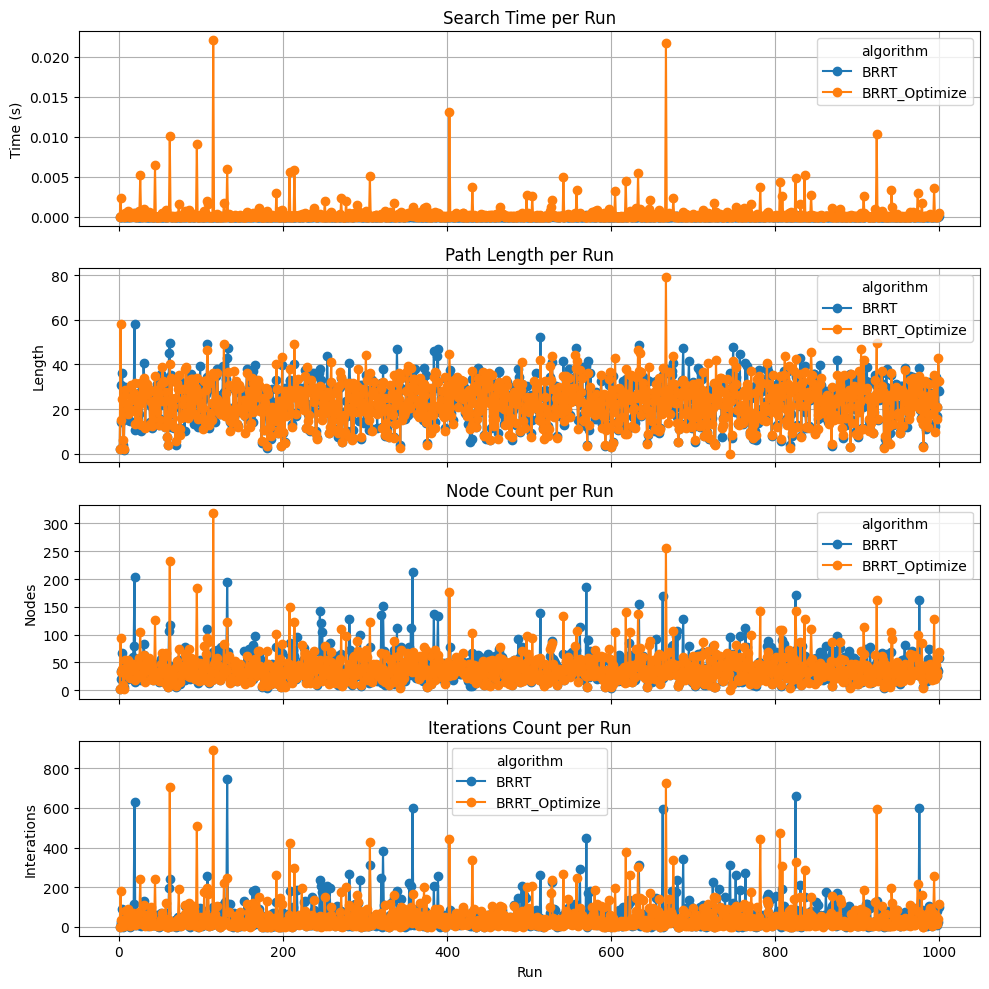

File: ./data/brrt_output0.3-2.0|0.4-0.6--0.0.json, BRRT_Optimize_score: 3.998541742617572, Diff: 0.011921830149647317


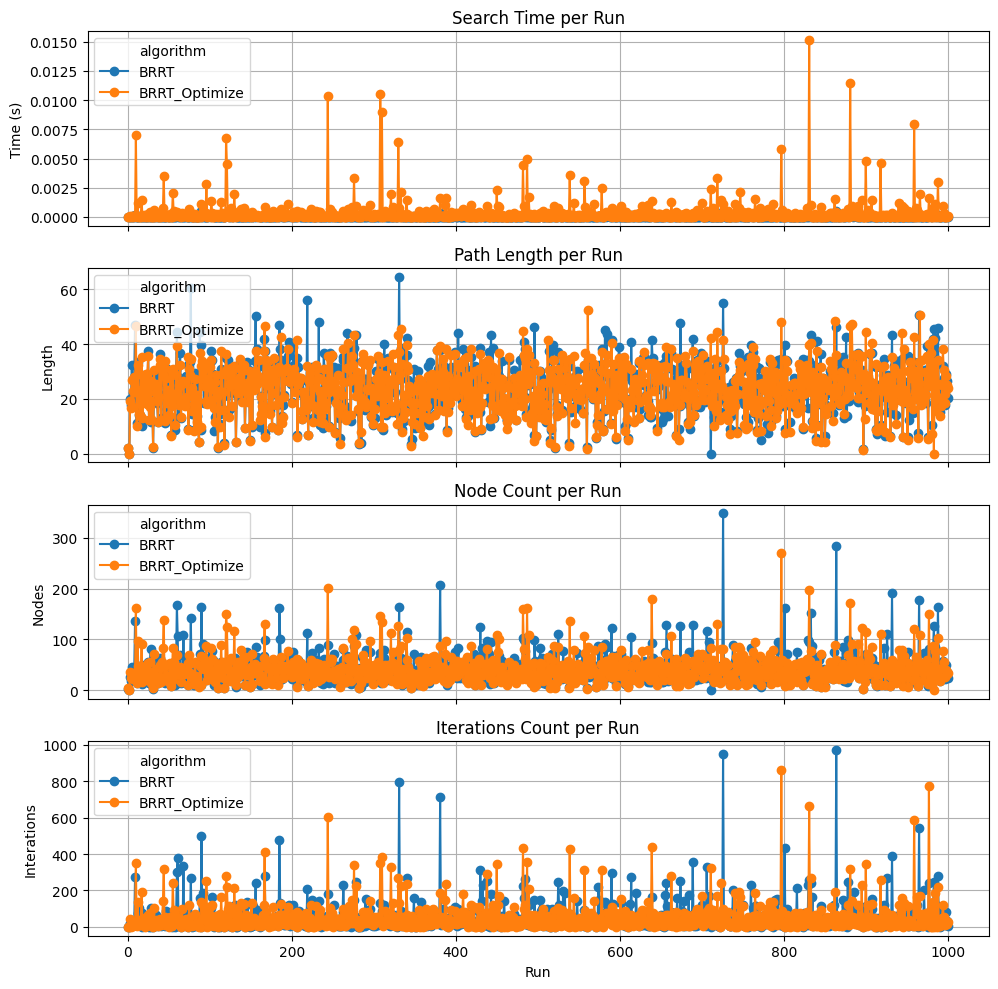

File: ./data/brrt_output0.3-6.0|0.2-0.4-0.4.json, BRRT_Optimize_score: 3.991999912407481, Diff: 0.009074944800698592


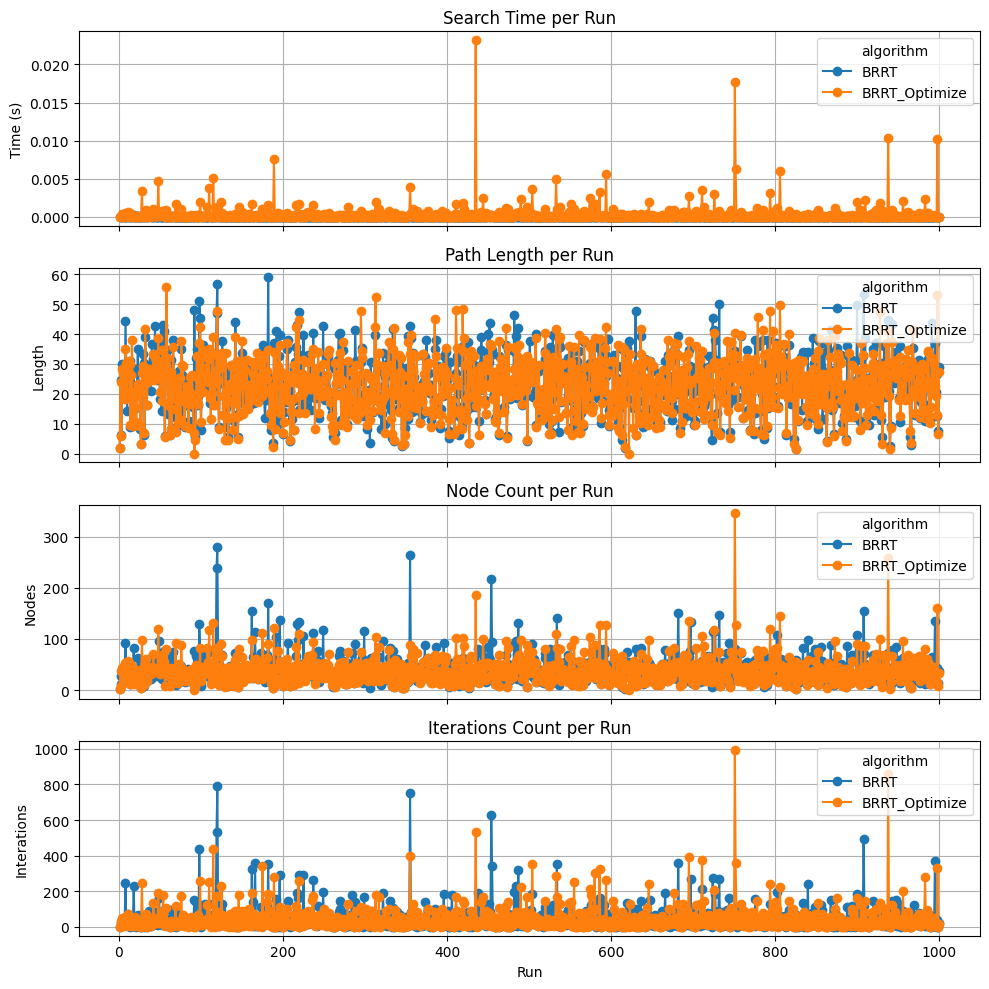

File: ./data/brrt_output0.5-4.0|0.2-0.2-0.6.json, BRRT_Optimize_score: 3.991634460153613, Diff: 0.008469062726006449


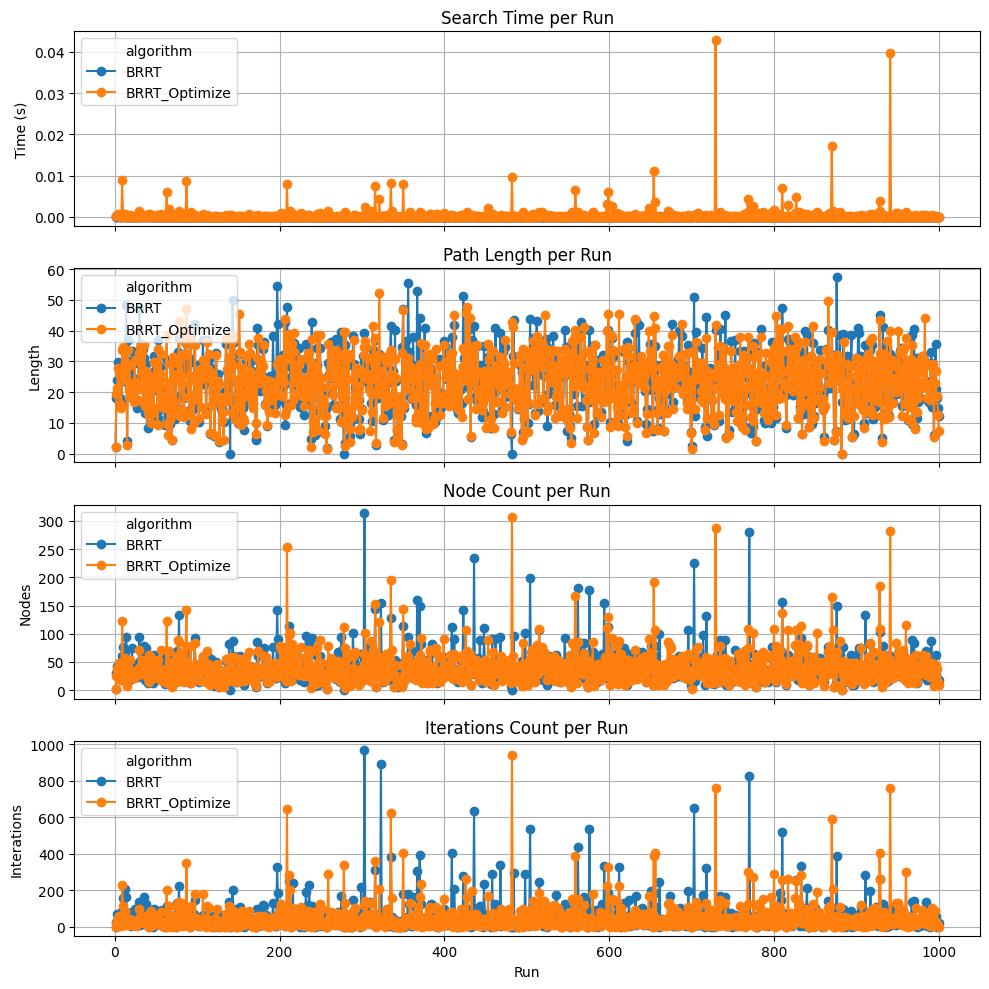

File: ./data/brrt_output0.5-6.0|0.2-0.8-0.0.json, BRRT_Optimize_score: 3.9890853928894, Diff: 0.007621228022878679


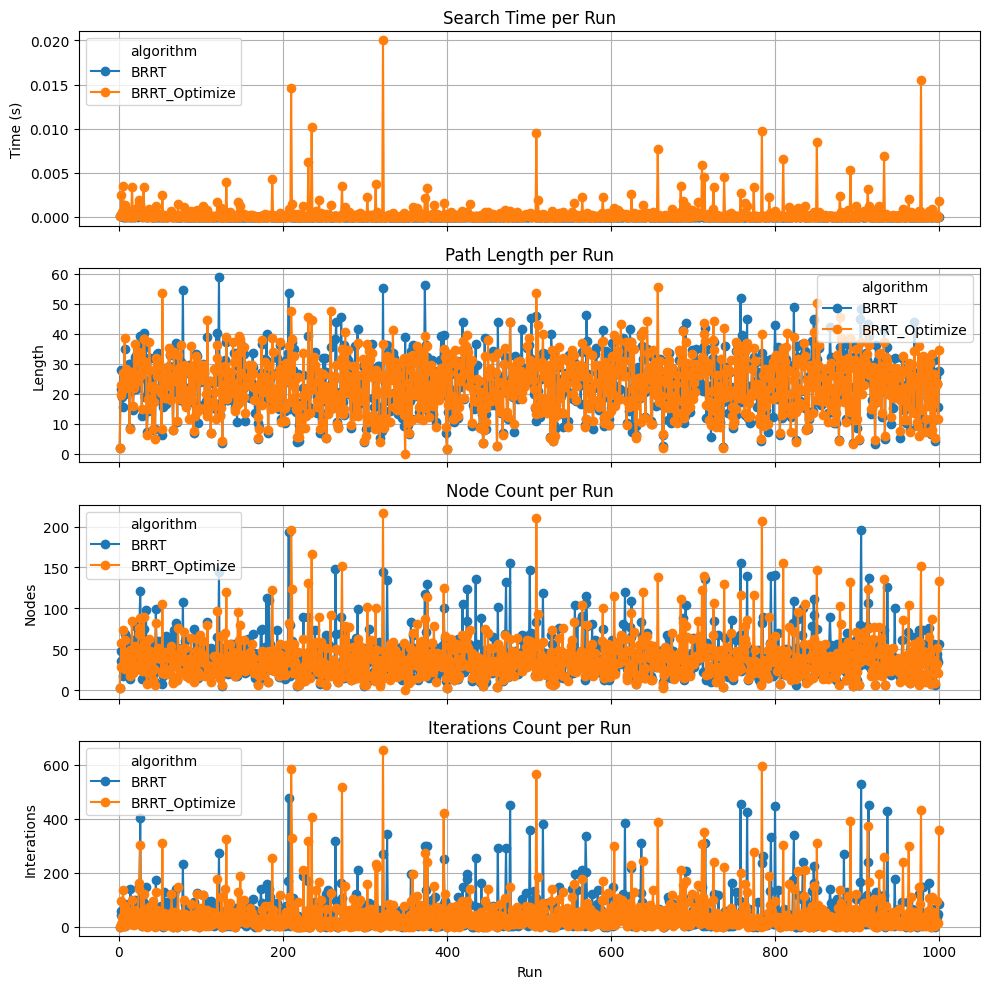

File: ./data/brrt_output0.3-10.0|0.2-0.6-0.2.json, BRRT_Optimize_score: 3.996930734183892, Diff: 0.007451092818964167


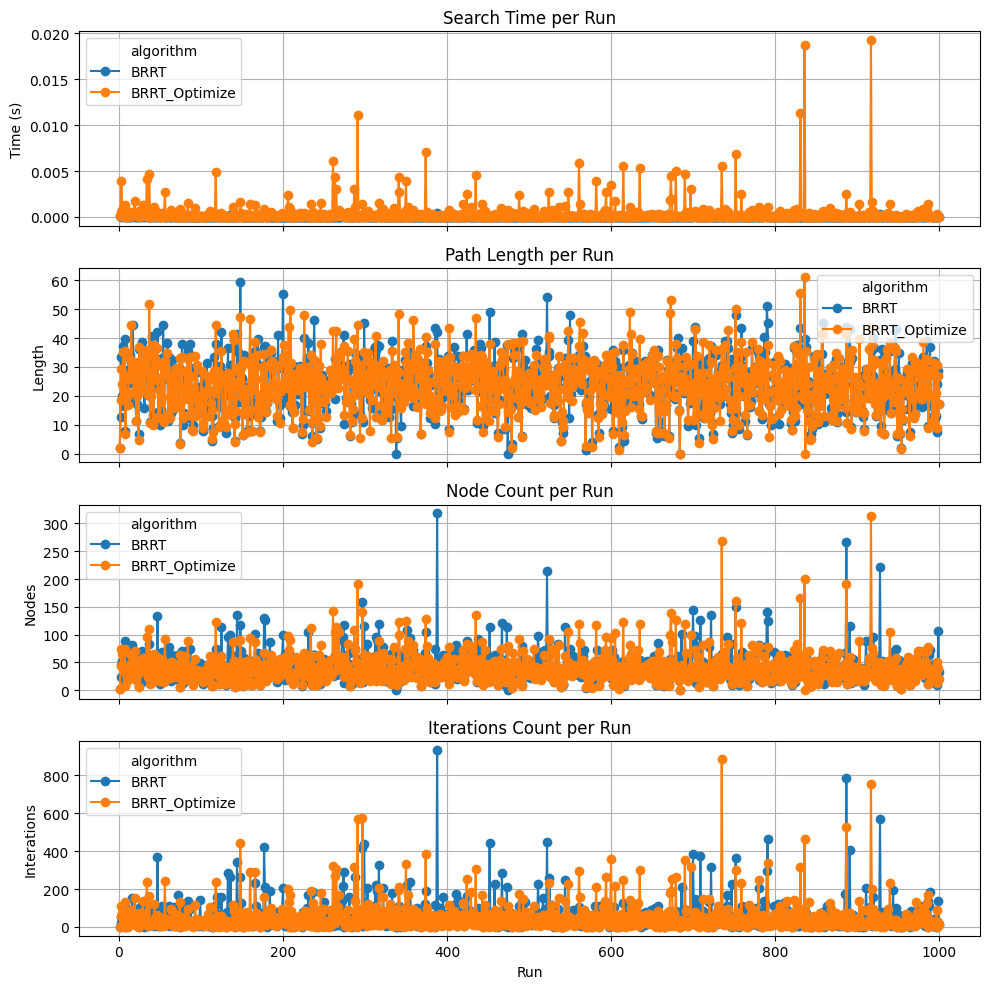

File: ./data/brrt_output0.5-8.0|0.4-0.2-0.4.json, BRRT_Optimize_score: 3.9946986748751, Diff: 0.007192794802752367


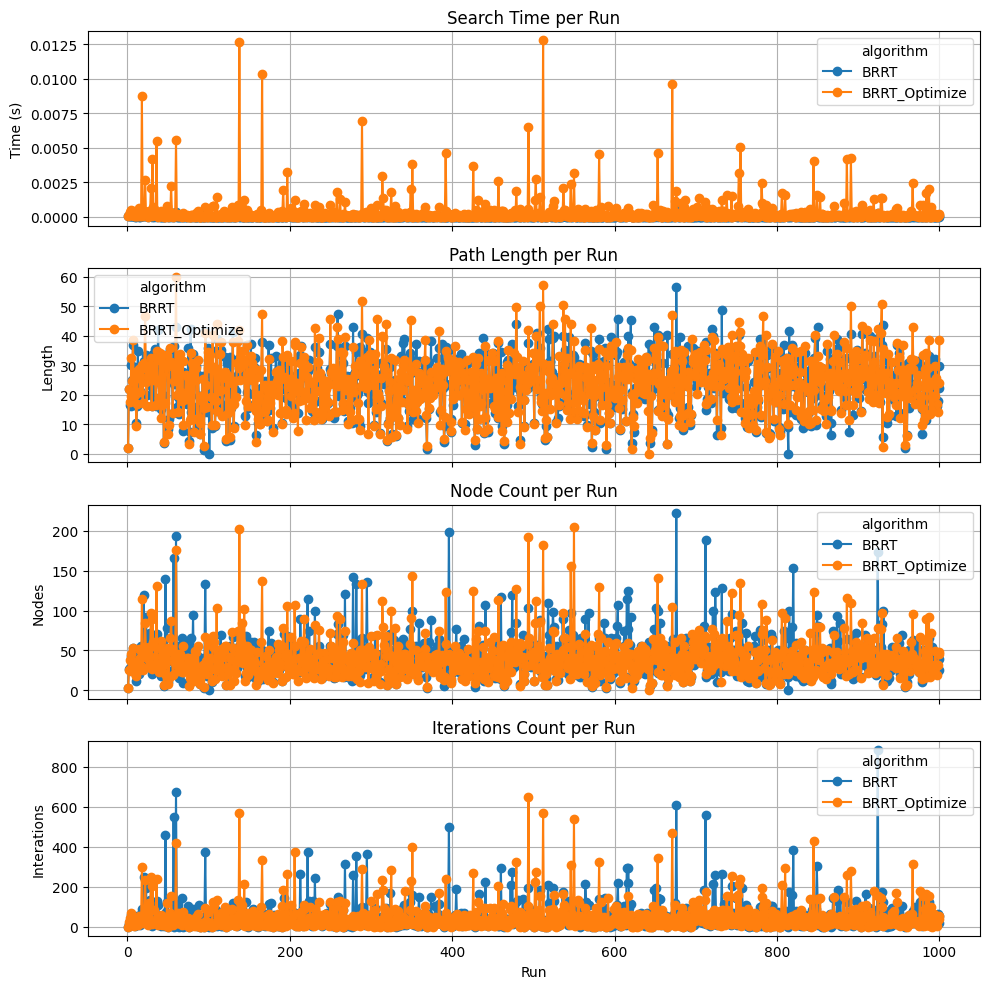

In [ ]:
for index, row in best_param.iterrows():
    print(f"File: {row['parameter']}, BRRT_Optimize_score: {row['BRRT_Optimize_score']}, Diff: {row['Diff']}")
    show(data_agg[row['parameter']])
    display_data(data_summary_df[row['parameter']])
